# Hemberg Lab on E725 Data

 * Scater (filtering, DE, plots)
 * SCRAN (normalisation)
 * ComBat (batch remover)
 * ccRemover + biomart (cell-cycle removal, annotation)
 * SC3 (clustering)

In [2]:
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(SingleCellExperiment))

In [1]:
# Load matrix
prdata <- readRDS("source/E725.quantif.matrix")

In [4]:
# Peek
head(prdata)
dim(prdata)

,B1_1,B1_2,B1_3,B1_4,B1_5,B1_6,B1_8,B1_9,B1_10,B1_11,⋯,B8_125,B8_129,B8_145,B8_148,B8_154,B8_161,B8_164,B8_169,B8_173,B8_180
0610007P14Rik,0,0,1,4,0,1,0,0,1,1,⋯,4,2,2,0,0,3,0,0,1,1
0610009B22Rik,0,3,4,3,1,4,0,0,1,1,⋯,1,4,1,2,0,2,0,1,0,1
0610009E02Rik,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0610009L18Rik,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0610009O20Rik,0,1,0,0,0,1,0,0,0,0,⋯,0,0,0,0,0,2,0,0,0,1
0610010F05Rik,1,0,0,1,0,0,0,0,0,0,⋯,2,0,0,0,0,0,0,0,1,2


[1] 26939   381

In [6]:
# Labelling step
# - Column cell vectors:
#   - Batch
#   - control cell
# - Row genes vectors (perform after cell filtering to reduce overhead in re-labelling):
#   - is spike
#   - is mitochondrial

batch <- as.integer(sub("B([0-9]+)(_[0-9]+)+", "\\1", colnames(prdata)))
length(batch);unique(batch)


[1] 381

[1] 1 2 3 4 6 7 8

In [8]:
sce <- SingleCellExperiment(assays = list(counts = as.matrix(prdata)), colData = list(batch_number = batch))
sce <- calculateQCMetrics(sce)
head(counts(sce))

,B1_1,B1_2,B1_3,B1_4,B1_5,B1_6,B1_8,B1_9,B1_10,B1_11,⋯,B8_125,B8_129,B8_145,B8_148,B8_154,B8_161,B8_164,B8_169,B8_173,B8_180
0610007P14Rik,0,0,1,4,0,1,0,0,1,1,⋯,4,2,2,0,0,3,0,0,1,1
0610009B22Rik,0,3,4,3,1,4,0,0,1,1,⋯,1,4,1,2,0,2,0,1,0,1
0610009E02Rik,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0610009L18Rik,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0610009O20Rik,0,1,0,0,0,1,0,0,0,0,⋯,0,0,0,0,0,2,0,0,0,1
0610010F05Rik,1,0,0,1,0,0,0,0,0,0,⋯,2,0,0,0,0,0,0,0,1,2


In [9]:
# Quick peek at the column data
names(colData(sce))
colData(sce)[,1:4]

# Quick peek at the row data
names(rowData(sce))
rowData(sce)[,1:4]



[1] "batch_number"                "total_features"             
 [3] "log10_total_features"        "total_counts"               
 [5] "log10_total_counts"          "pct_counts_top_50_features" 
 [7] "pct_counts_top_100_features" "pct_counts_top_200_features"
 [9] "pct_counts_top_500_features" "is_cell_control"

DataFrame with 381 rows and 4 columns
       batch_number total_features log10_total_features total_counts
          <integer>      <integer>            <numeric>    <integer>
B1_1              1           4685             3.670802        18545
B1_2              1           6709             3.826723        36508
B1_3              1           6348             3.802705        32684
B1_4              1           6404             3.806519        37364
B1_5              1            682             2.834421          963
...             ...            ...                  ...          ...
B8_161            8           7638             3.883037        46845
B8_164            8            825             2.916980         1202
B8_169            8           3429             3.535294         9726
B8_173            8           4986             3.697839        17260
B8_180            8           7176             3.855943        38932

[1] "is_feature_control" "mean_counts"        "log10_mean_counts" 
[4] "rank_counts"        "n_cells_counts"     "pct_dropout_counts"
[7] "total_counts"       "log10_total_counts"

DataFrame with 26939 rows and 4 columns
      is_feature_control mean_counts log10_mean_counts rank_counts
               <logical>   <numeric>         <numeric>   <numeric>
1                  FALSE 1.367454068       0.374281562     23220.0
2                  FALSE 1.060367454       0.313944681     22464.5
3                  FALSE 0.010498688       0.004535754     11667.0
4                  FALSE 0.007874016       0.003406249     10985.5
5                  FALSE 0.417322835       0.151468784     19613.0
...                  ...         ...               ...         ...
26935              FALSE           0                 0        3492
26936              FALSE           0                 0        3492
26937              FALSE           0                 0        3492
26938              FALSE           0                 0        3492
26939              FALSE           0                 0        3492

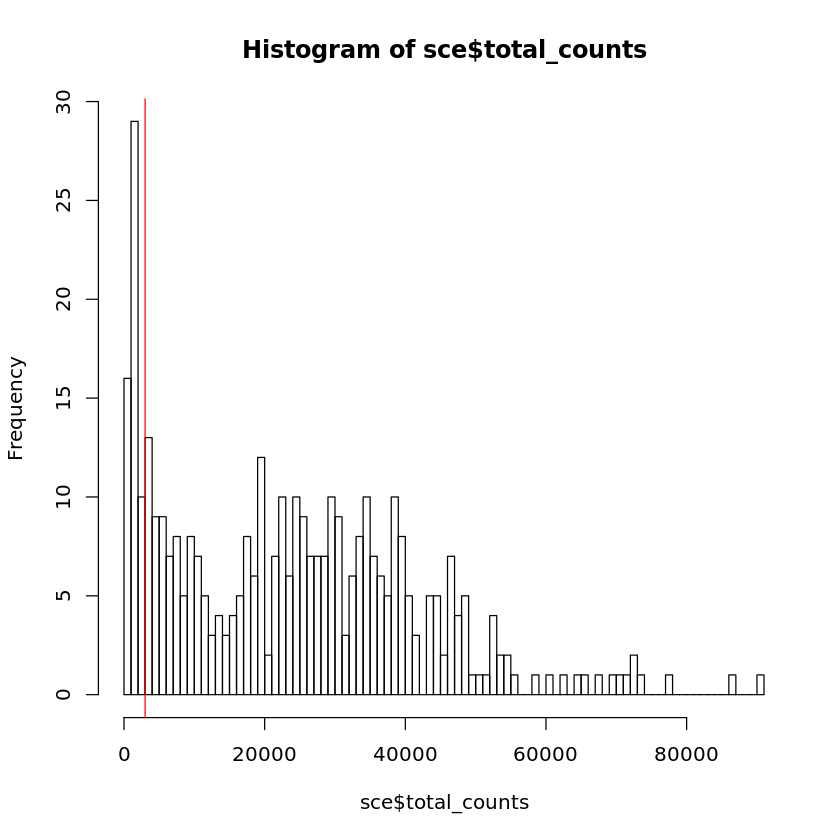

In [10]:
# Quick look at the distribution with default cutoff of 3000
hist(sce$total_counts, breaks=100)
abline(v=3000, col="red")



26939,381
26939,326


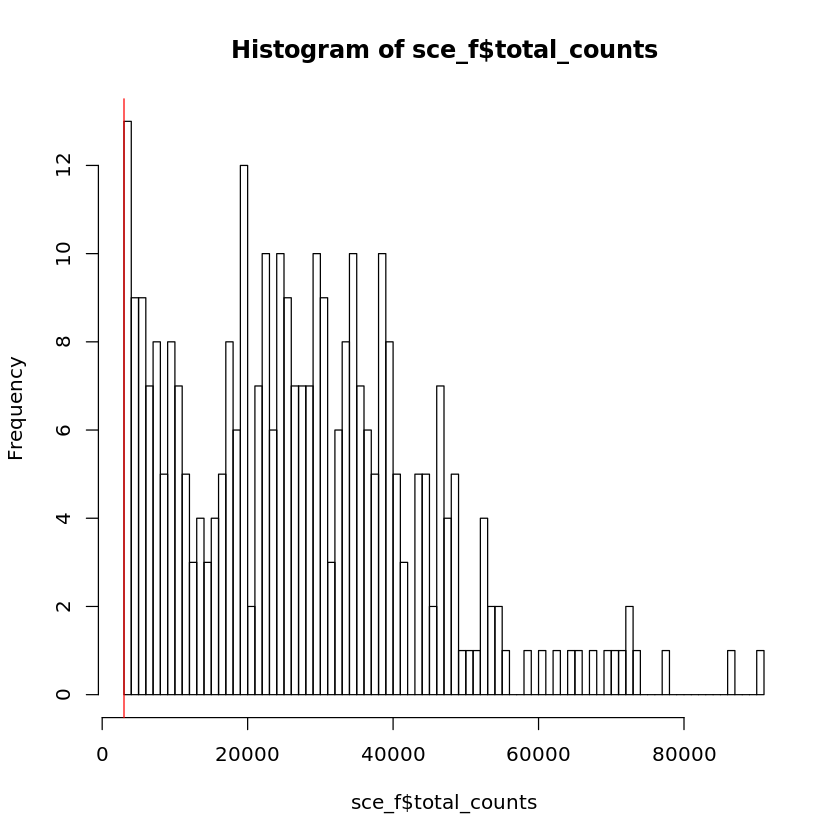

In [11]:
sce_f <- sce[,sce$total_counts > 3000]
hist(sce_f$total_counts, breaks=100)
abline(v=3000, col='red')
rbind(dim(sce),dim(sce_f))

In [9]:
# We are down from 430 cells to 326.
# Now we will filter for low quality genes (any genes with less than 2 total counts across all)
sce_fg <- sce_f[rowSums(counts(sce_f)) > 2,]
dim(sce_fg)
# We are now down from 33901 to 17498 genes

[1] 17498   326

In [10]:
# Now we will perform gene labelling to see if we have any mitochondrial genes or other 
## NOTE: If you want to skip pulling data straight from the internet you can skip to the next part and just load K from disk
suppressWarnings(require(biomaRt))
# Annotate the data before adding SC experiment

mart <- useMart(biomart = "ENSEMBL_MART_ENSEMBL", 
                dataset = "mmusculus_gene_ensembl")

k <- getBM(
    filters = "mgi_symbol",
    attributes = c(
            "ensembl_gene_id",              # Gene stable ID
            "external_gene_name",           # Casual name
            "mgi_symbol",
#            "external_transcript_name",     # Transcript-specific name
#            "gene_biotype",                 # Gene biotype
#            "transcript_biotype",           # Trans type
            "description",                  # Gene description
#            "band",                         # Karyotype band
#            "refseq_mrna",
            "go_id",                        # Go Term accession (cellular domains)
#            "go_linkage_type",              # Go Term evidence code
            "name_1006"                    # Go Term name
#            "definition_1006",              # Go Term definition
#            "namespace_1003"                # Go domain                  
    ),
    values = rownames(sce_fg),
    mart = mart
)


Loading required package: biomaRt


In [11]:
ktitle <- "saved_k.biomart"
#saveRDS(k, ktitle)
k <- readRDS(ktitle)

In [12]:
gCC <- k$mgi_symbol[k$name_1006 == "cell cycle"]
gCP <- k$mgi_symbol[k$name_1006 == "cell proliferation"]

cellproliferation_genes <- unique(c(gCC, gCP))
length(cellproliferation_genes)

[1] 696

In [13]:
# Look for mitochondrial related genes
mito_desc <- unique(k$mgi_symbol[grepl("mitochondria", k$description)])
mito_symb <- unique(k$mgi_symbol[grepl("mitochondria", k$name_1006)])

mitochondrial_genes <- unique(union(mito_desc, mito_symb))

length(mito_desc); length(mito_symb); length(mitochondrial_genes)

[1] 428

[1] 897

[1] 990

In [14]:
# 696 state vacillation genes, and 990 mitochondrial genes
# - Annotate control genes, and remove cell-cycle genes
rowData(sce_fg)$is_cell_cycle <- rownames(sce_fg) %in% cellproliferation_genes

isSpike(sce_fg, "MT") <- rownames(sce_fg) %in% mitochondrial_genes
sce_fg <- calculateQCMetrics(
    sce_fg,
    feature_controls = list(
        MT = isSpike(sce_fg, "MT")
    )
)

In [15]:
rowData(sce_fg)[,1:4]
sum(rowData(sce_fg)$is_cell_cycle)
sum(rowData(sce_fg)$is_feature_control)

DataFrame with 17498 rows and 4 columns
      is_cell_cycle is_feature_control is_feature_control_MT mean_counts
          <logical>          <logical>             <logical>   <numeric>
1             FALSE              FALSE                 FALSE 1.580375494
2             FALSE              FALSE                 FALSE 1.230454359
3             FALSE              FALSE                 FALSE 0.012271437
4             FALSE              FALSE                 FALSE 0.009203578
5             FALSE              FALSE                 FALSE 0.487833073
...             ...                ...                   ...         ...
17494         FALSE              FALSE                 FALSE   0.2638531
17495         FALSE              FALSE                 FALSE   1.9211988
17496         FALSE              FALSE                 FALSE   4.6525596
17497         FALSE              FALSE                 FALSE   0.3865900
17498         FALSE              FALSE                 FALSE   2.7963431

[1] 696

[1] 990

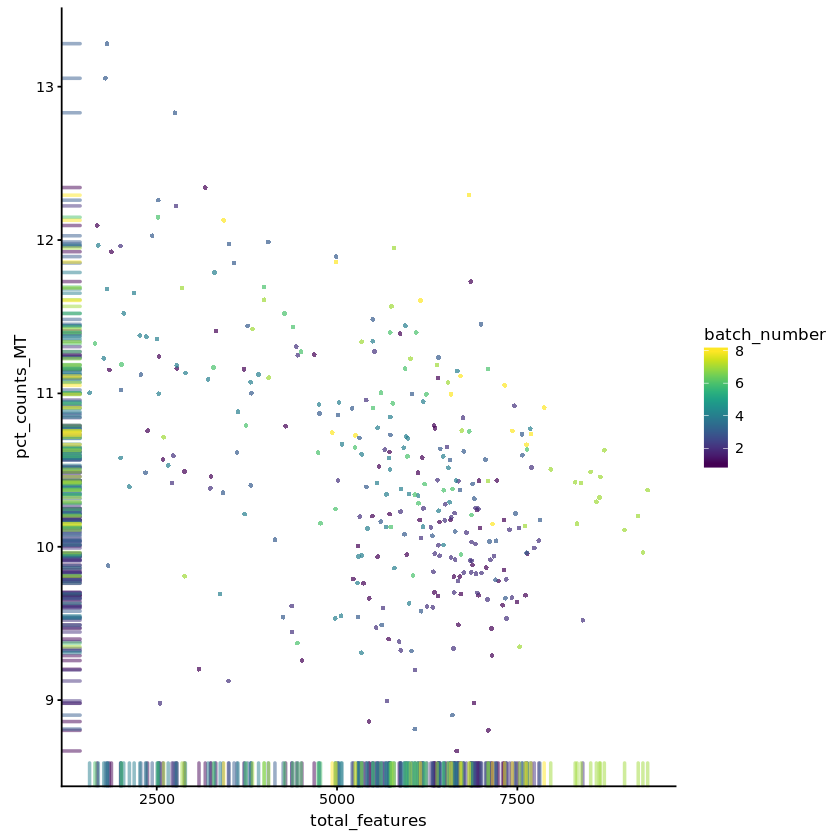

In [16]:
plotPhenoData(
    sce_fg,
    aes_string(
        x = "total_features",
        y = "pct_counts_MT",
        colour = "batch_number"
    )
)

In [17]:
# No particular batch appears to have any more control genes than others, so it is not neccesary to filter anything
# out just yet.
summary(sce_fg$pct_counts_MT < 14)
# We can also see that the percentage of counts contributed by MT genes are less than 14%
# So there's really no need to filter out anything.

   Mode    TRUE 
logical     326 

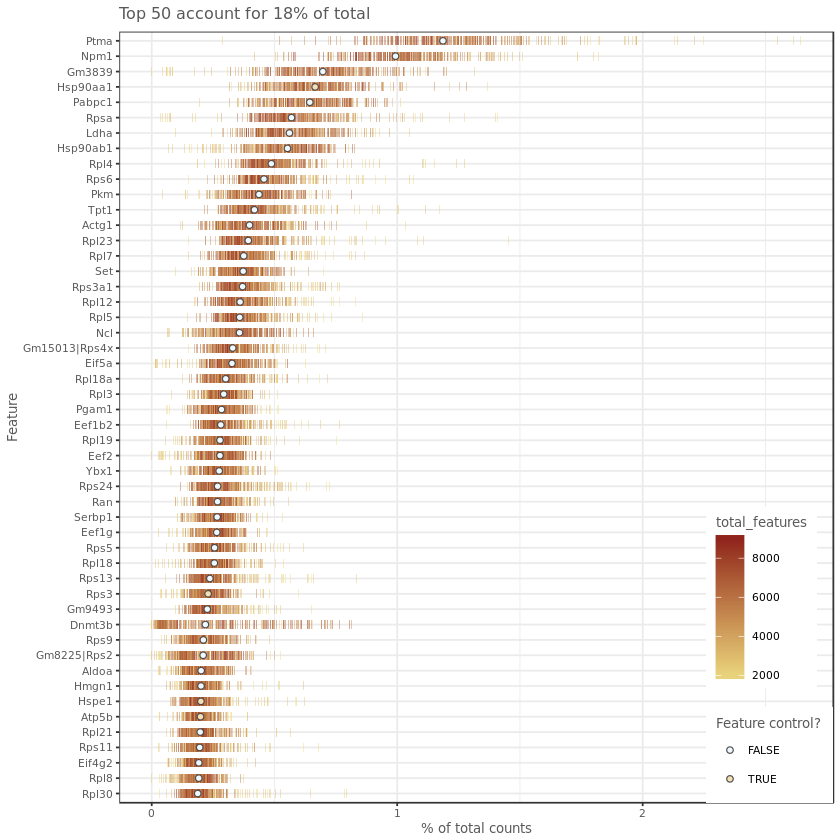

In [18]:
plotQC(sce_fg, type = "highest-expression")

In [19]:
# Is this plot actually meaningful if we have not yet performed normalisation? Let's use scran and deseq2
suppressWarnings(library(scran))
suppressWarnings(library(data.table))

#names(colData(sce_fg)$pct_counts_top_200_features)
sce_scran <- copy(sce_fg)
sce_scran <- computeSumFactors(sce_scran)
sce_scran <- normalise(sce_scran)


Loading required package: BiocParallel

Attaching package: ‘data.table’

The following object is masked from ‘package:SummarizedExperiment’:

    shift

The following object is masked from ‘package:GenomicRanges’:

    shift

The following object is masked from ‘package:IRanges’:

    shift

The following objects are masked from ‘package:S4Vectors’:

    first, second

Warning message in .local(object, ...):
“spike-in transcripts in 'MT' should have their own size factors”

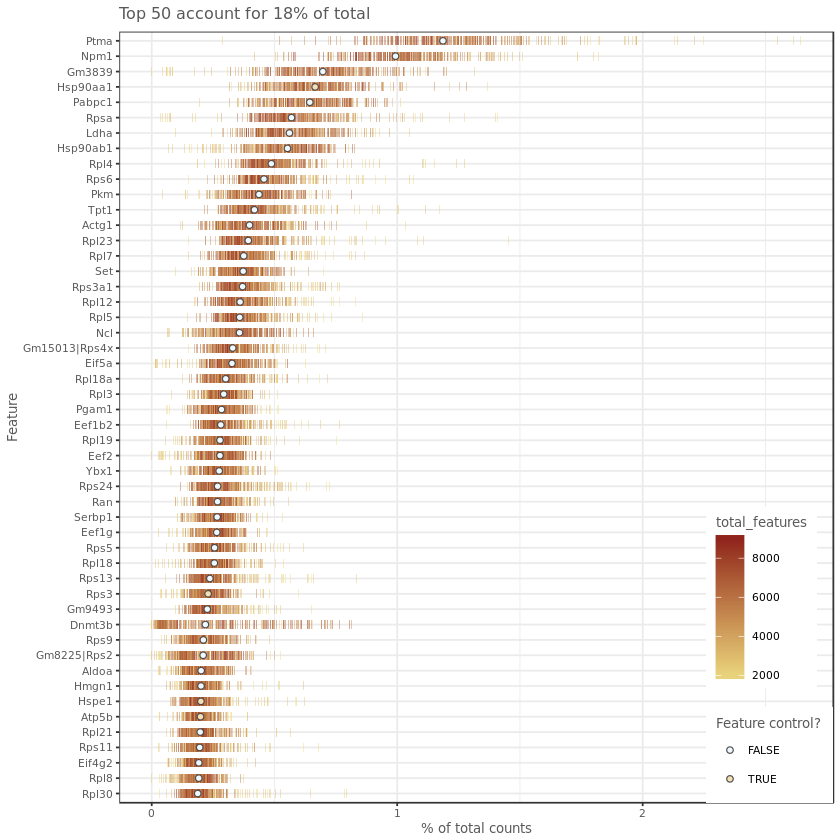

In [20]:
#assays(sce_fg)
#assays(sce_scran)
sce_scran <- calculateQCMetrics(
    sce_scran,
    feature_controls = list(
        MT = isSpike(sce_scran, "MT")
    )
)

plotQC(sce_scran, type = "highest-expression")

The variable is_cell_control only has one unique value, so R^2 is not meaningful.
This variable will not be plotted.


[1] "batch_number"                               
 [2] "total_features"                             
 [3] "log10_total_features"                       
 [4] "total_counts"                               
 [5] "log10_total_counts"                         
 [6] "pct_counts_top_50_features"                 
 [7] "pct_counts_top_100_features"                
 [8] "pct_counts_top_200_features"                
 [9] "pct_counts_top_500_features"                
[10] "total_features_endogenous"                  
[11] "log10_total_features_endogenous"            
[12] "total_counts_endogenous"                    
[13] "log10_total_counts_endogenous"              
[14] "pct_counts_endogenous"                      
[15] "pct_counts_top_50_features_endogenous"      
[16] "pct_counts_top_100_features_endogenous"     
[17] "pct_counts_top_200_features_endogenous"     
[18] "pct_counts_top_500_features_endogenous"     
[19] "total_features_feature_control"             
[20] "log10_total_features_feature_control"       
[21] "total_counts_feature_control"               
[22] "log10_total_counts_feature_control"         
[23] "pct_counts_feature_control"                 
[24] "pct_counts_top_50_features_feature_control" 
[25] "pct_counts_top_100_features_feature_control"
[26] "pct_counts_top_200_features_feature_control"
[27] "pct_counts_top_500_features_feature_control"
[28] "total_features_MT"                          
[29] "log10_total_features_MT"                    
[30] "total_counts_MT"                            
[31] "log10_total_counts_MT"                      
[32] "pct_counts_MT"                              
[33] "pct_counts_top_50_features_MT"              
[34] "pct_counts_top_100_features_MT"             
[35] "pct_counts_top_200_features_MT"             
[36] "pct_counts_top_500_features_MT"             
[37] "is_cell_control"

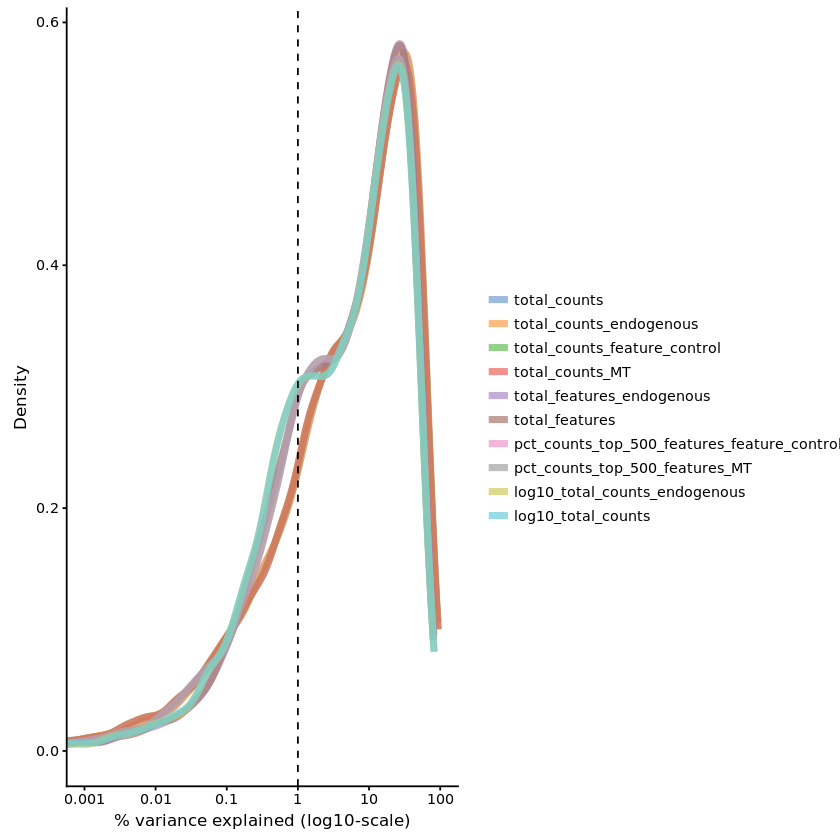

In [21]:
plotExplanatoryVariables(sce_fg, exprs_values="counts")
names(colData(sce_fg))

The variable is_cell_control only has one unique value, so R^2 is not meaningful.
This variable will not be plotted.


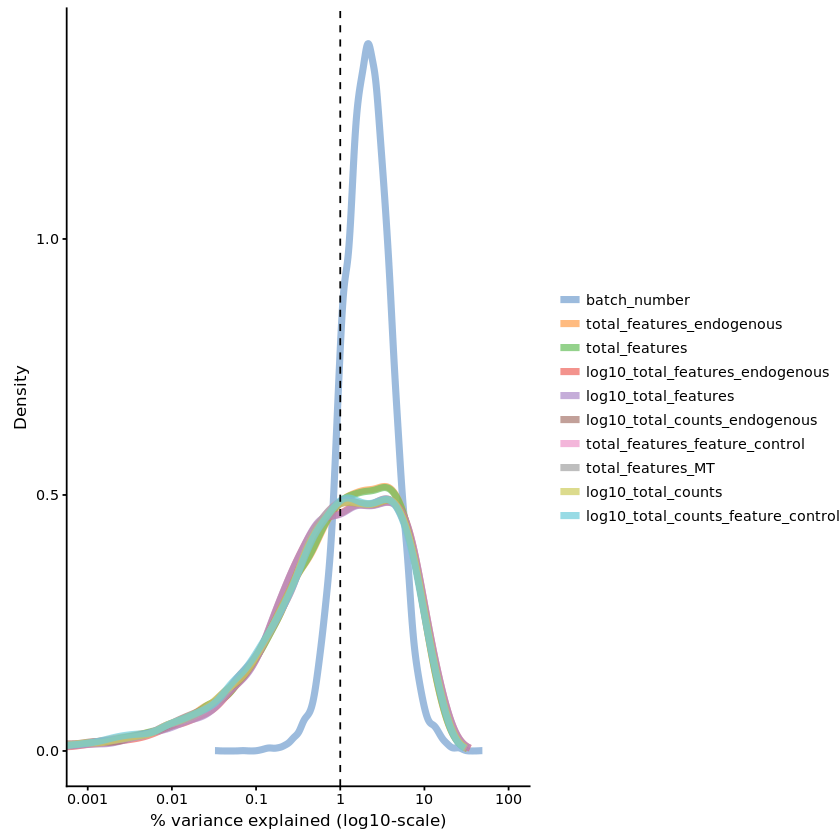

In [22]:
plotExplanatoryVariables(sce_scran, exprs_values="logcounts")

In [23]:
# Remove cell cycle effect
mean_gene_exp <- rowMeans(logcounts(sce_scran))
t_cell_data_cen <- logcounts(sce_scran) - mean_gene_exp

gret <- rbind(
    summary(apply(logcounts(sce_scran),1, mean)),
    summary(apply(t_cell_data_cen,1,mean))
)

rownames(gret) <- c("Before ZeroNorm:", "After ZeroNorm:")
signif(gret,6)

gene_names <- rownames(t_cell_data_cen)
cut_gene_names <- sub("(.+)-[^-]+", "\\1", gene_names)

,Min.,1st Qu.,Median,Mean,3rd Qu.,Max.
Before ZeroNorm:,2.08698e-03,2.94936e-02,0.228123,6.21539e-01,8.72280e-01,8.42115e+00
After ZeroNorm:,-4.37303e-16,-6.01291e-18,0.000000,2.22487e-19,6.44686e-18,4.42902e-16


In [24]:
suppressWarnings(library(ccRemover))
length(cut_gene_names)
length(unique(cut_gene_names))

cell_cycle_gene_indices <- gene_indexer(cut_gene_names, species = "mouse", name_type = "ensemble")

[1] 17498

[1] 17248

Invalid name type input. Switching to NULLNo name format input.
Checking to see if match can be found:
Best guess is  symbol  IDs
1301  matches out of a possible  17498


In [25]:
if_cc <- rep(FALSE,nrow(t_cell_data_cen)) 
if_cc[cell_cycle_gene_indices] <- TRUE
summary(if_cc)

dat <- list(x=t_cell_data_cen, if_cc=if_cc)

xhat <- ccRemover(dat, bar=FALSE)

   Mode   FALSE    TRUE 
logical   16197    1301 

0.07435135  of genes are cell-cycle genes
Iteration  1 ...
Bootstrapping...The bootstrap results on the top 10 components are:       xn_load  xy_load diff_load t_load_boot
PC1  2.3533162 3.404359 1.0510431   12.891316
PC2  1.8754792 2.637629 0.7621494    4.162630
PC3  1.5695945 1.985258 0.4156633    4.908698
PC4  1.3408032 1.718392 0.3775890    6.441069
PC5  1.2764773 1.722837 0.4463595    8.494429
PC6  1.1931291 1.468249 0.2751198    6.322814
PC7  1.0824170 1.402879 0.3204616    3.676757
PC8  1.0221639 1.319204 0.2970401    4.749366
PC9  0.9744016 1.222667 0.2482654    5.000278
PC10 0.9568863 1.285923 0.3290369    6.465332
The follow components are removed: 1 2 3 4 5 6 7 8 9 10

Iteration  2 ...
Bootstrapping...The bootstrap results on the top 10 components are:       xn_load  xy_load diff_load t_load_boot
PC1  0.9443803 1.203381 0.2590003    5.273973
PC2  0.9245654 1.186470 0.2619041    5.347610
PC3  0.9141746 1.187265 0.2730902    5.782094
PC4  0.9126591 1.124463 0.2118035    4.2761

The variable is_cell_control only has one unique value, so R^2 is not meaningful.
This variable will not be plotted.


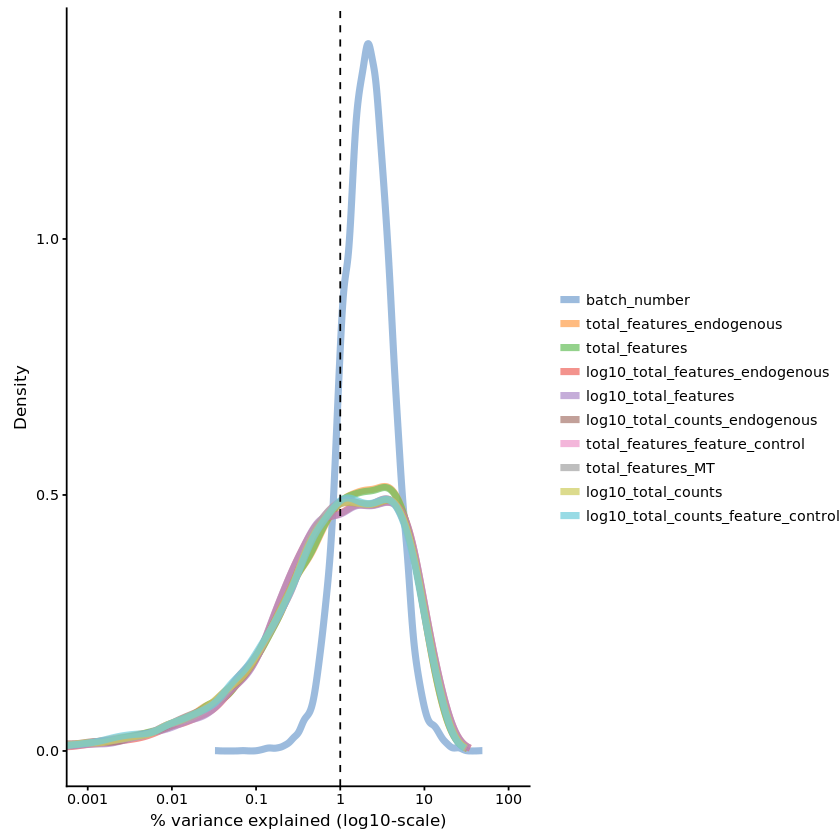

In [26]:
plotExplanatoryVariables(sce_scran, exprs_values="logcounts")

The variable is_cell_control only has one unique value, so R^2 is not meaningful.
This variable will not be plotted.


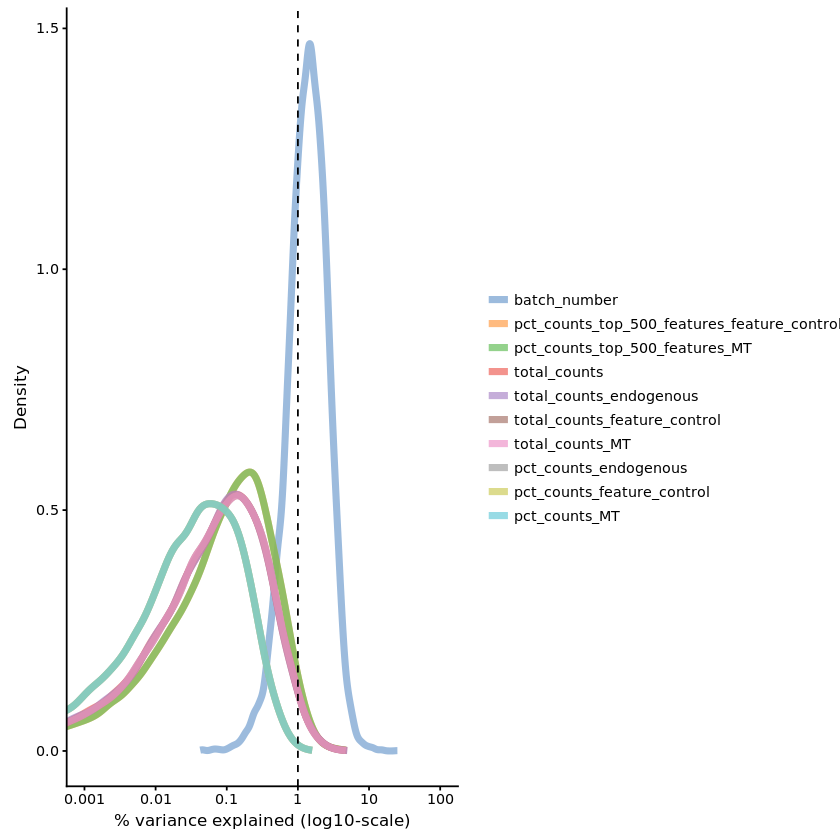

In [27]:
logcounts(sce_scran) <- xhat
plotExplanatoryVariables(sce_scran, exprs_values="logcounts")

In [28]:
# Reduced variation from almost all (+ve/-ve) contributors except batch_number

# Let's reduce batch effects via ComBat
suppressWarnings(library(sva))

combat_data <- logcounts(sce_scran)
mod_data <- as.data.frame(t(combat_data))
mod0 = model.matrix(~ 1, data = mod_data)   # basic batch remove 

assay(sce_scran, "combat") <- ComBat(
    dat = t(mod_data), 
    batch = factor(sce_scran$batch_number), 
    mod = mod0,
    par.prior = TRUE,
    prior.plots = FALSE
)


Loading required package: mgcv
Loading required package: nlme

Attaching package: ‘nlme’

The following object is masked from ‘package:IRanges’:

    collapse

This is mgcv 1.8-23. For overview type 'help("mgcv-package")'.
Loading required package: genefilter

Attaching package: ‘genefilter’

The following objects are masked from ‘package:matrixStats’:

    rowSds, rowVars

Found7batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



In [1]:
plotExplanatoryVariables(sce_scran, exprs_values="combat")
head(assay(sce_scran, "combat"))

ERROR: Error in plotExplanatoryVariables(sce_scran, exprs_values = "combat"): could not find function "plotExplanatoryVariables"


In [37]:
#saveRDS(sce_scran, "checkpoint.1.rds")
# Nicly reduced the batch effect on the data
sce_scran <- readRDS("checkpoint.1.rds")
library(SC3)

In [42]:
rowData(sce_scran)$feature_symbol = rownames(sce_scran)       # must connect this slot for SC3
sce_scran <- sc3_estimate_k(sce_scran)
message("Best guess on the number of clusters: ", metadata(sce_scran)$sc3$k_estimation)

Estimating k...
Best guess on the number of clusters: 37


In [45]:
krange <- c(2,3,4,5,6,8,9,10,15,20,25,30,37)
sce_scran <- sc3(sce_scran, ks = krange, biology = TRUE)

Setting SC3 parameters...
Calculating distances between the cells...
Performing transformations and calculating eigenvectors...
Performing k-means clustering...


Calculating consensus matrix...
Calculating biology...


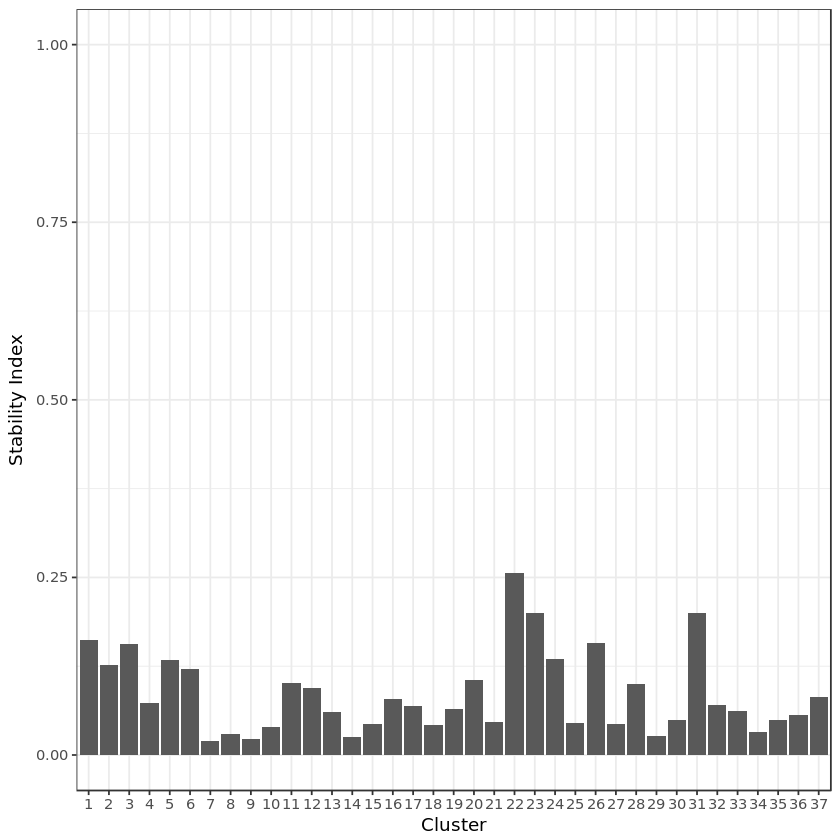

In [46]:
sc3_plot_cluster_stability(sce_scran, tail(krange, n=1))

Plots
k = 2


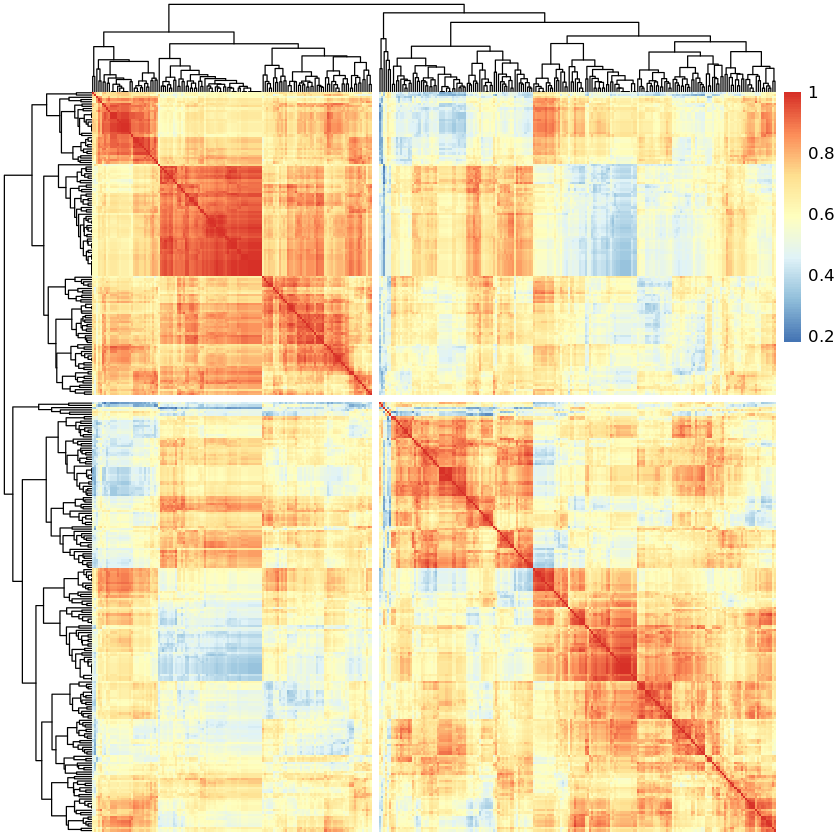

k = 3


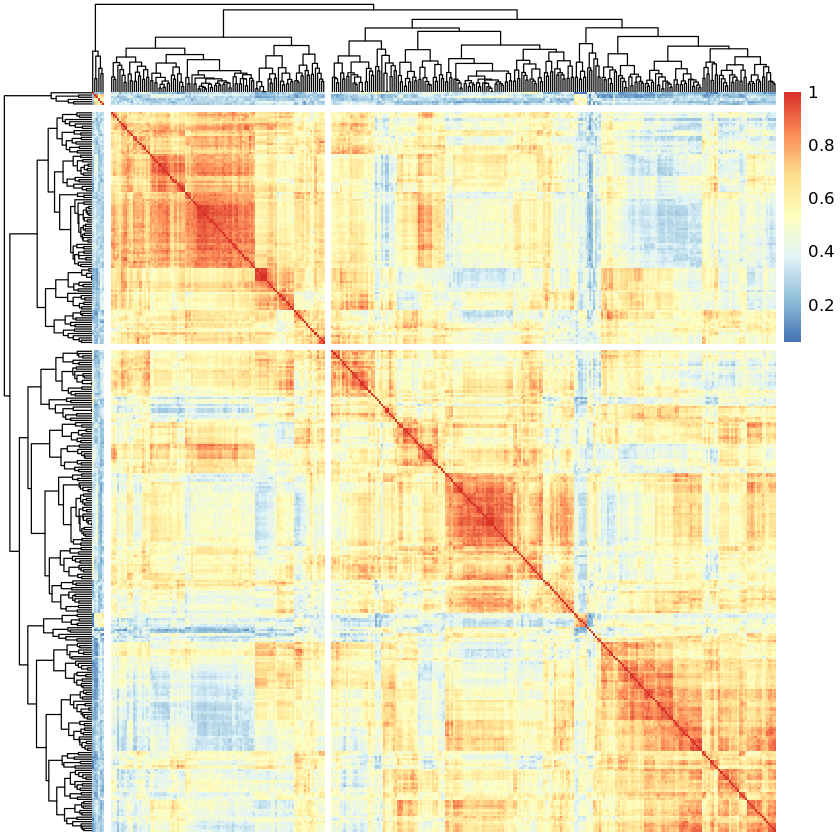

k = 4


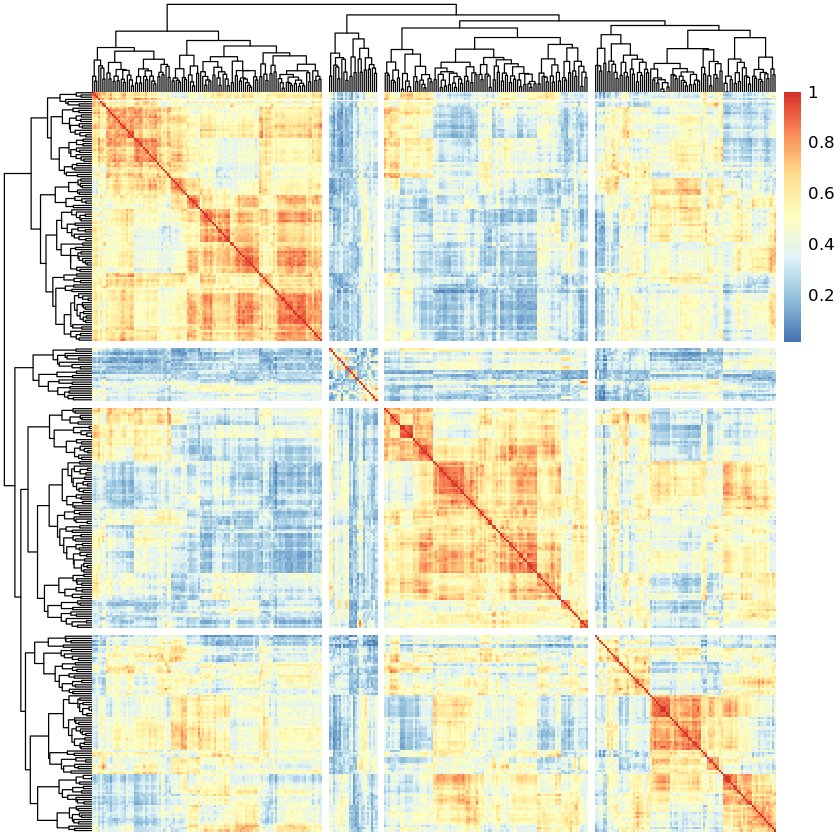

k = 5


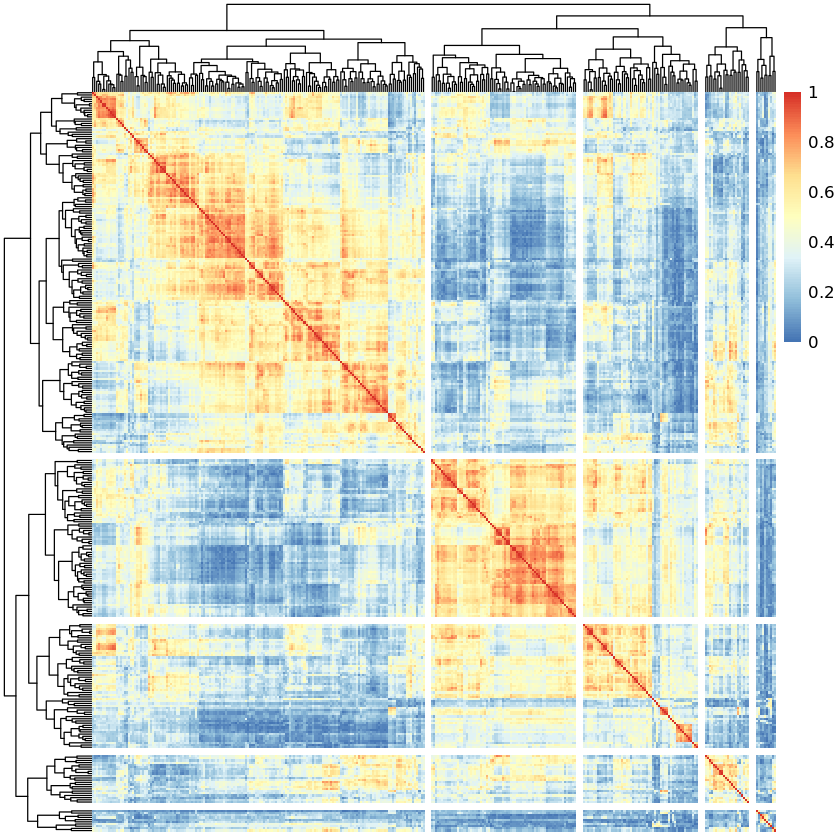

k = 6


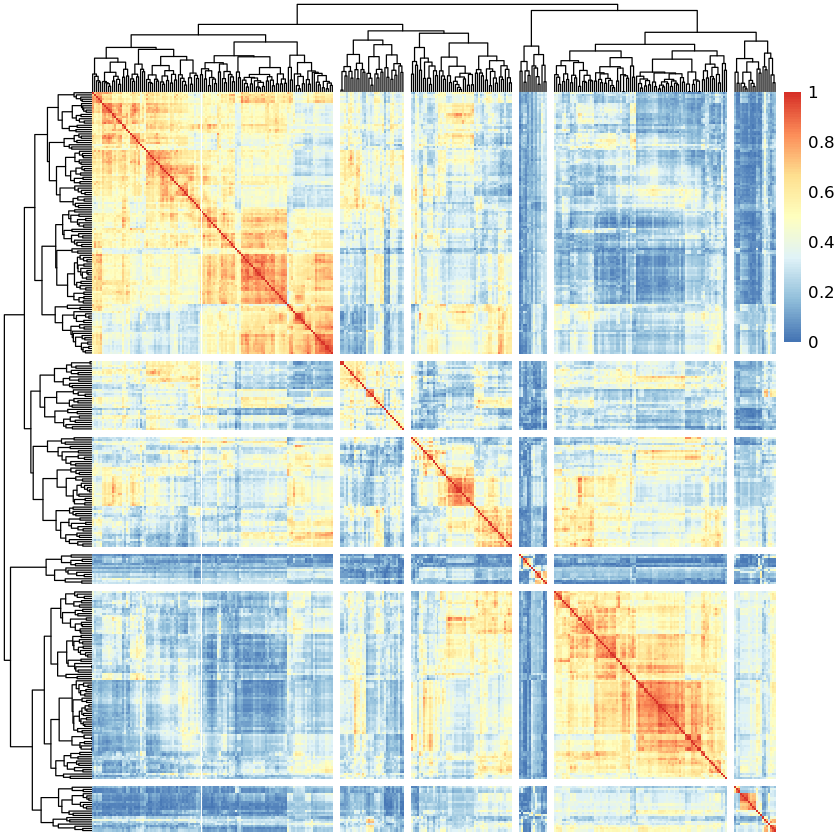

k = 8


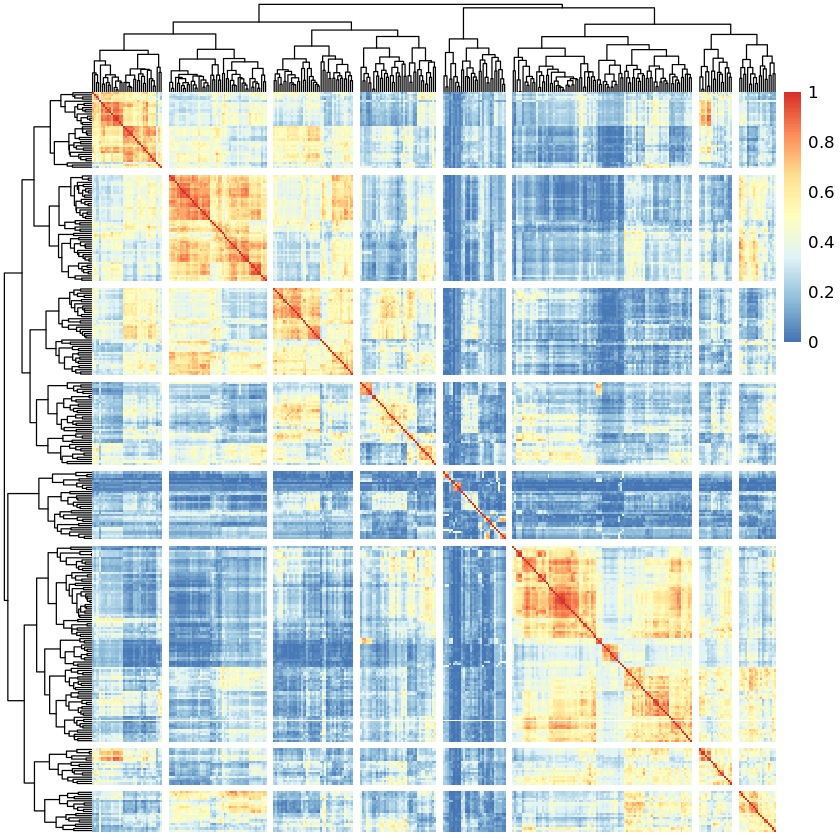

k = 9


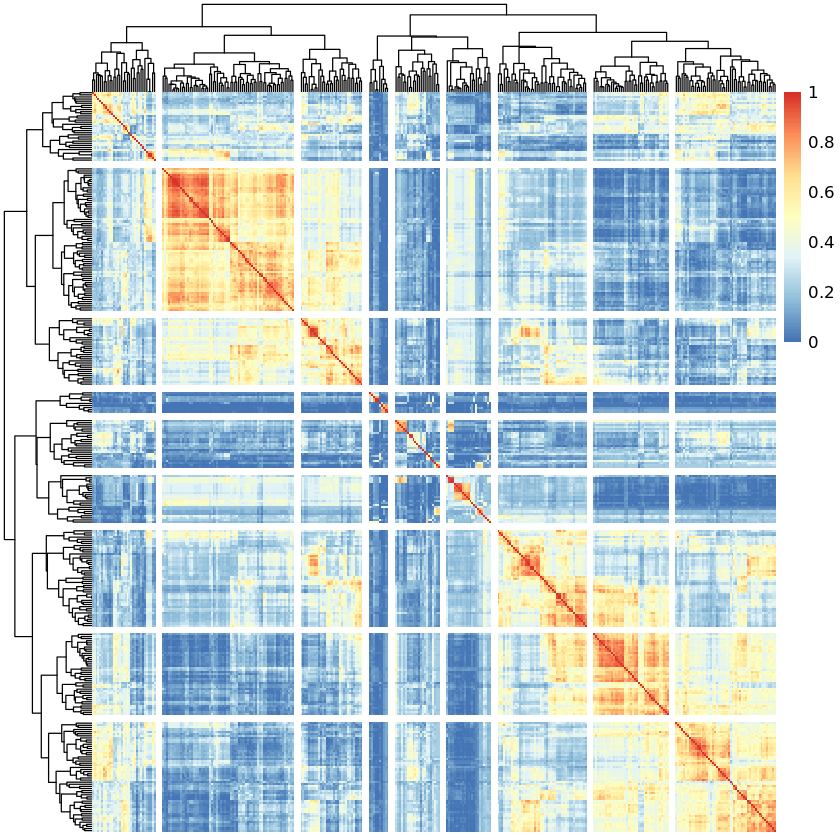

k = 10


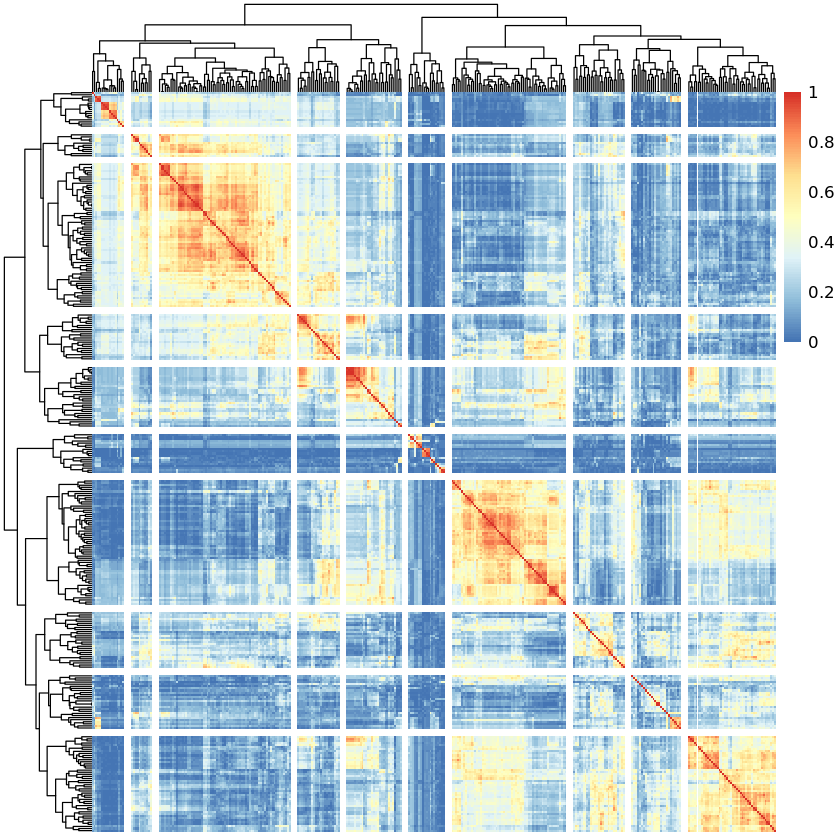

k = 15


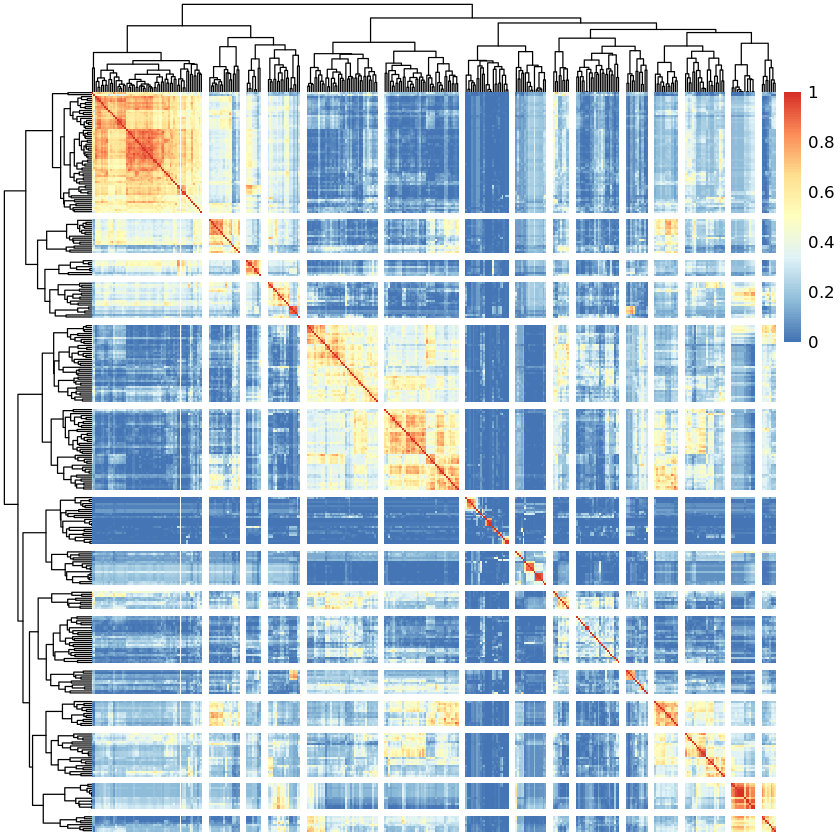

k = 20


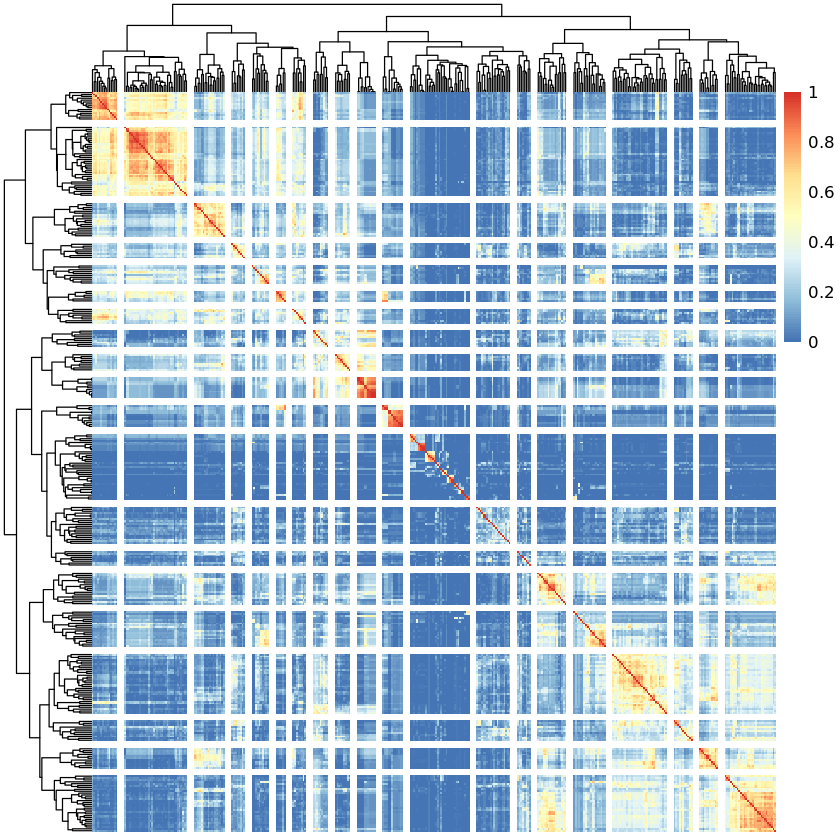

k = 25


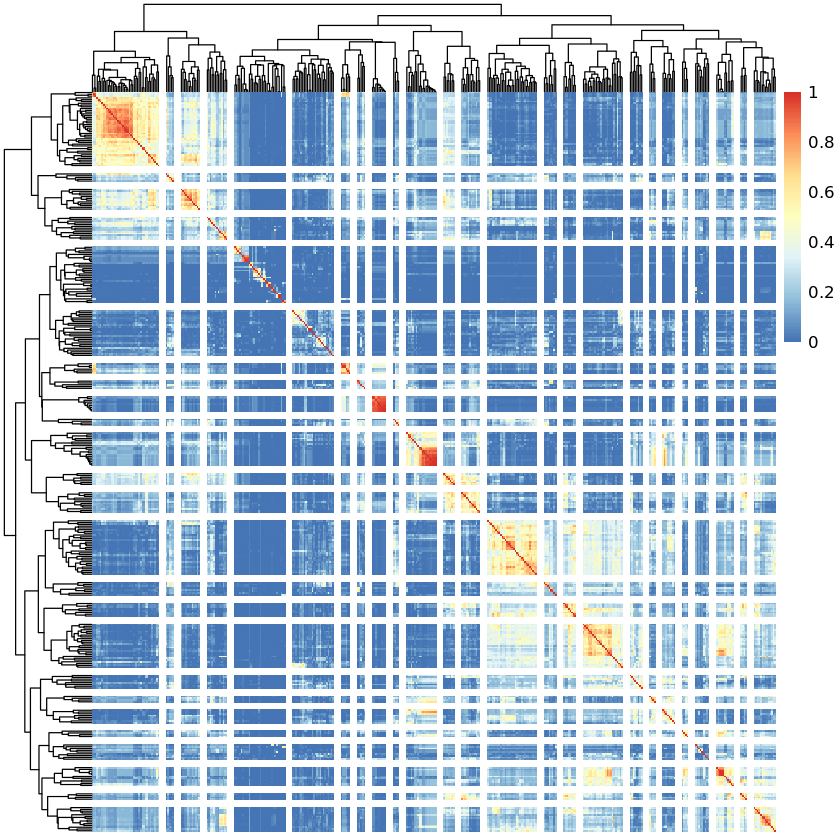

k = 30


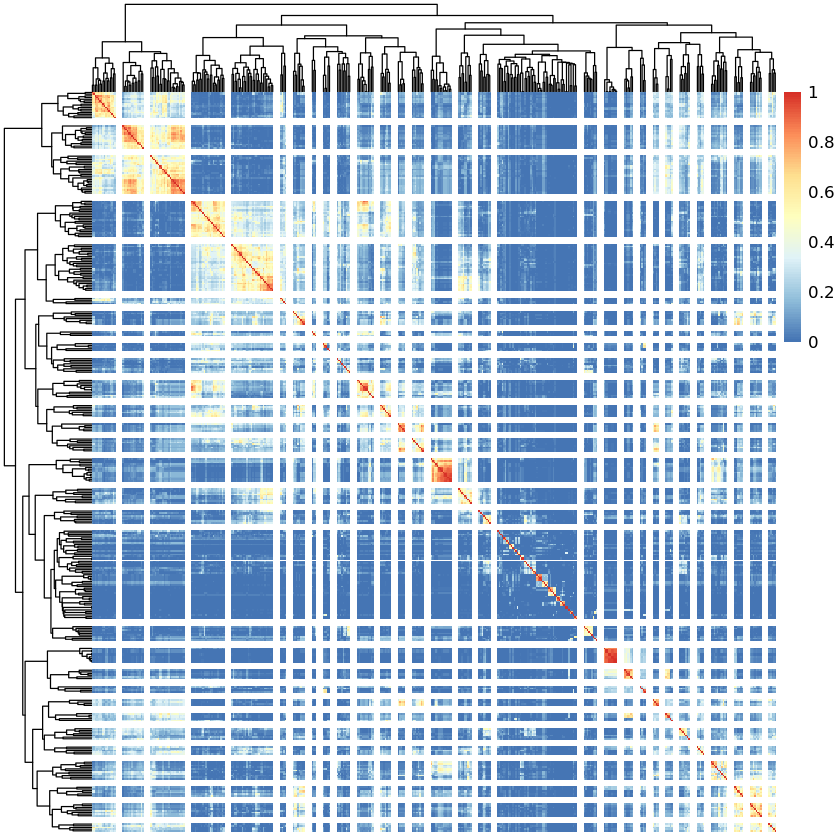

k = 37


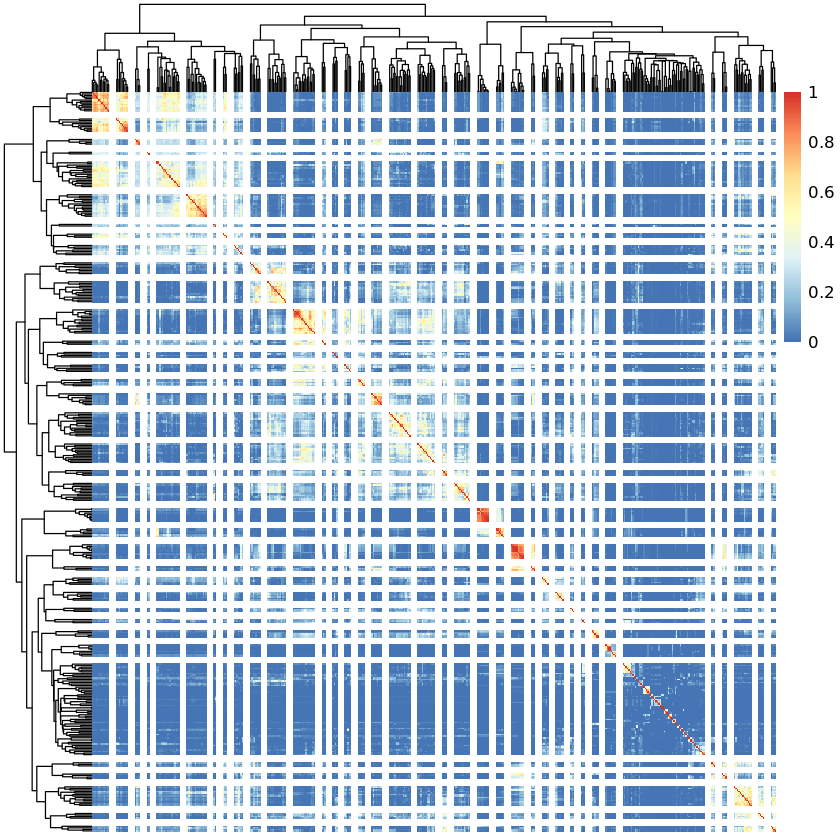

In [48]:
library(gridExtra)

#multiplot(    # doesn't work for sc3

cat("Plots\n")
for (k in krange){   
    sc3_plot_consensus(sce_scran, k)
    cat(sprintf("k = %.0f\n", k))
}

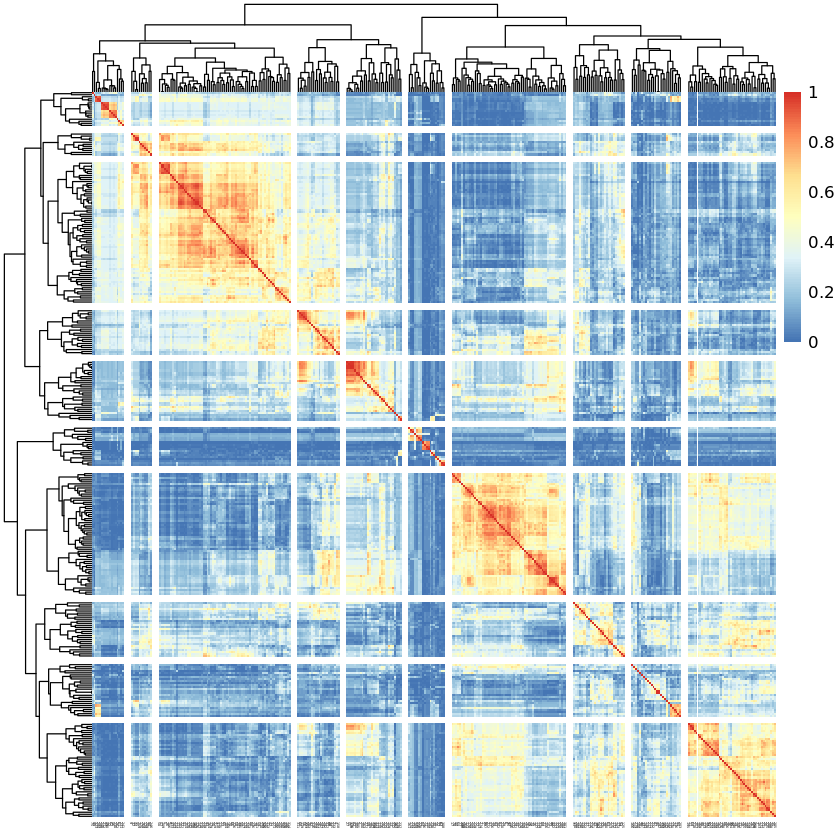

In [81]:
# Custom plots with cell names fixed
sc3_plot_consensus2 <- function(object, k, show_pdata = NULL) {
    if (is.null(metadata(object)$sc3$consensus)) {
        warning(paste0("Please run sc3_consensus() first!"))
        return(object)
    }
    hc <- metadata(object)$sc3$consensus[[as.character(k)]]$hc
    consensus <- metadata(object)$sc3$consensus[[as.character(k)]]$consensus
    
    add_ann_col <- FALSE
    ann <- NULL
    if (!is.null(show_pdata)) {
        ann <- make_col_ann_for_heatmaps(object, show_pdata)
        if (!is.null(ann)) {
            add_ann_col <- TRUE
            # make same names for the annotation table
            rownames(ann) <- colnames(consensus)
        }
    }
    do.call(pheatmap::pheatmap, c(list(consensus, cluster_rows = hc, cluster_cols = hc, cutree_rows = k, 
        cutree_cols = k, show_rownames = F, show_colnames = T, fontsize_col = 2), list(annotation_col = ann)[add_ann_col]))
}

#options(jupyter.plot_mimetypes = "image/svg+xml") 
#options(repr.plot.width = 3, repr.plot.height = 3)
sc3_plot_consensus2(sce_scran, 10)

ERROR: Error in display(SVG("test.svg")): could not find function "display"


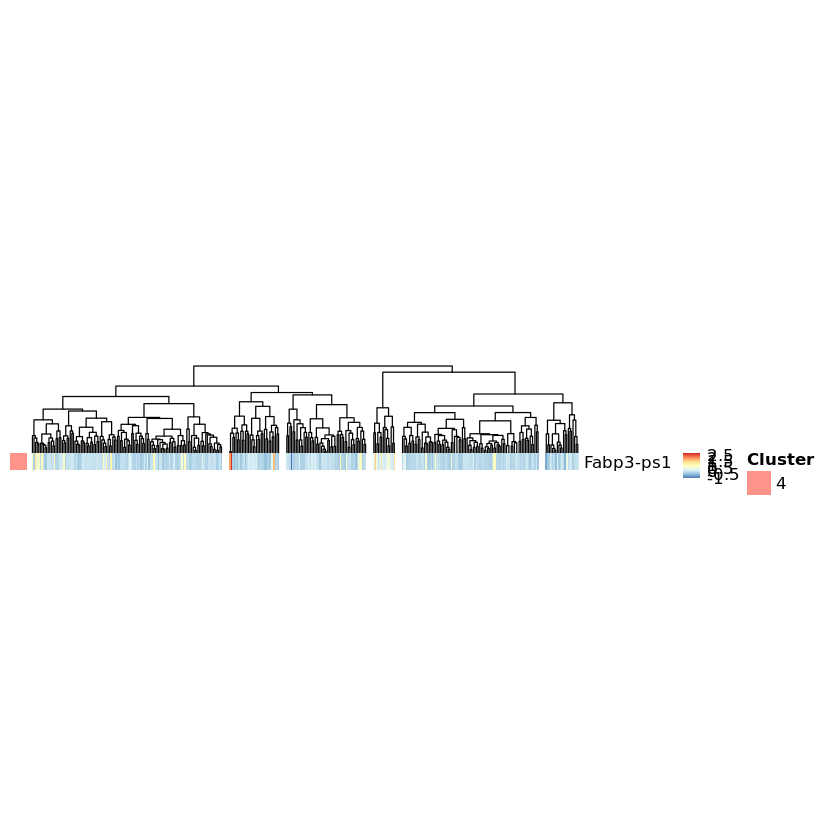

In [57]:
sc3_plot_markers(sce_scran, 6)

Plots
k = 2


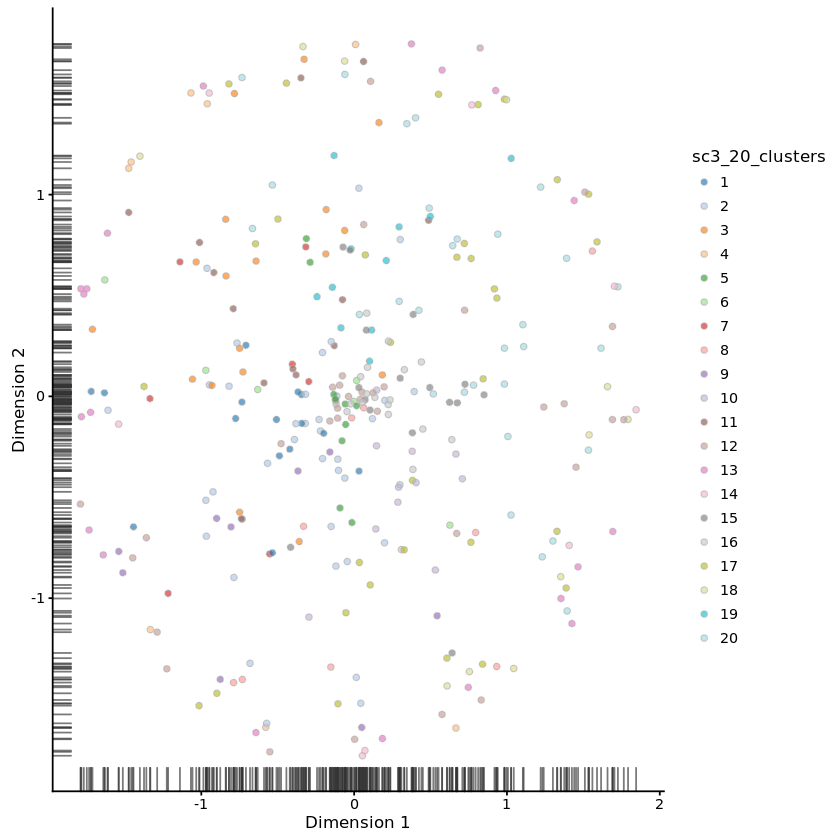

k = 3


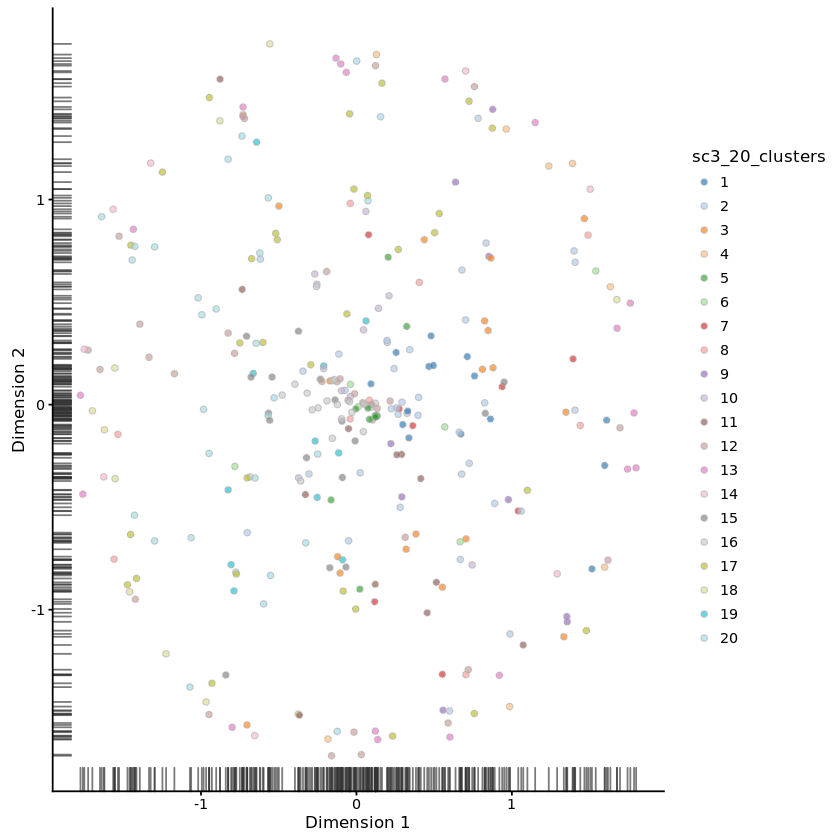

k = 4


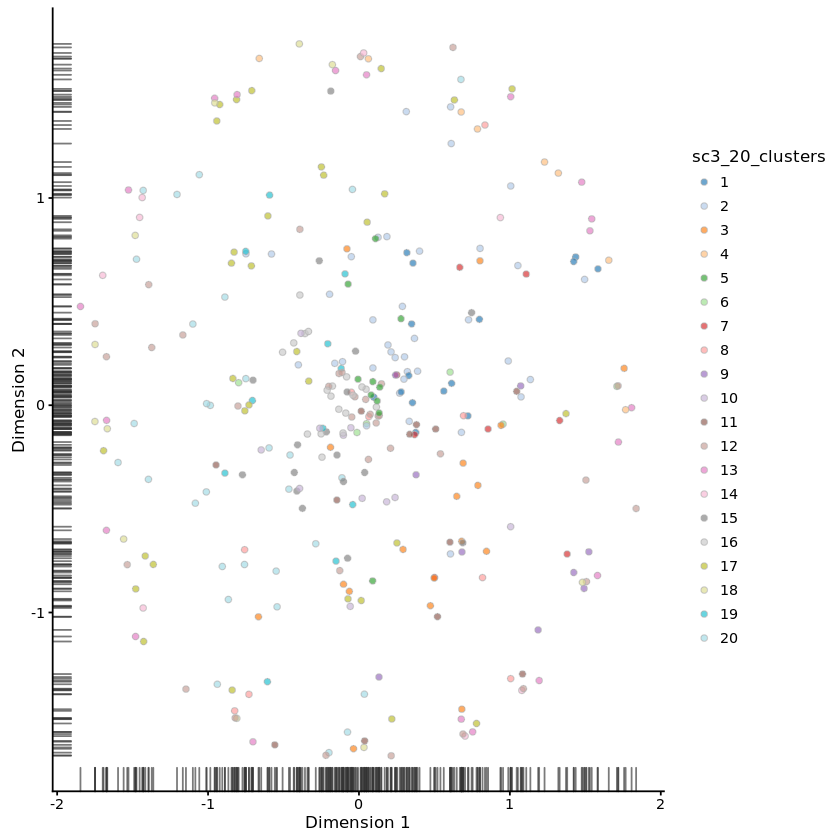

k = 5


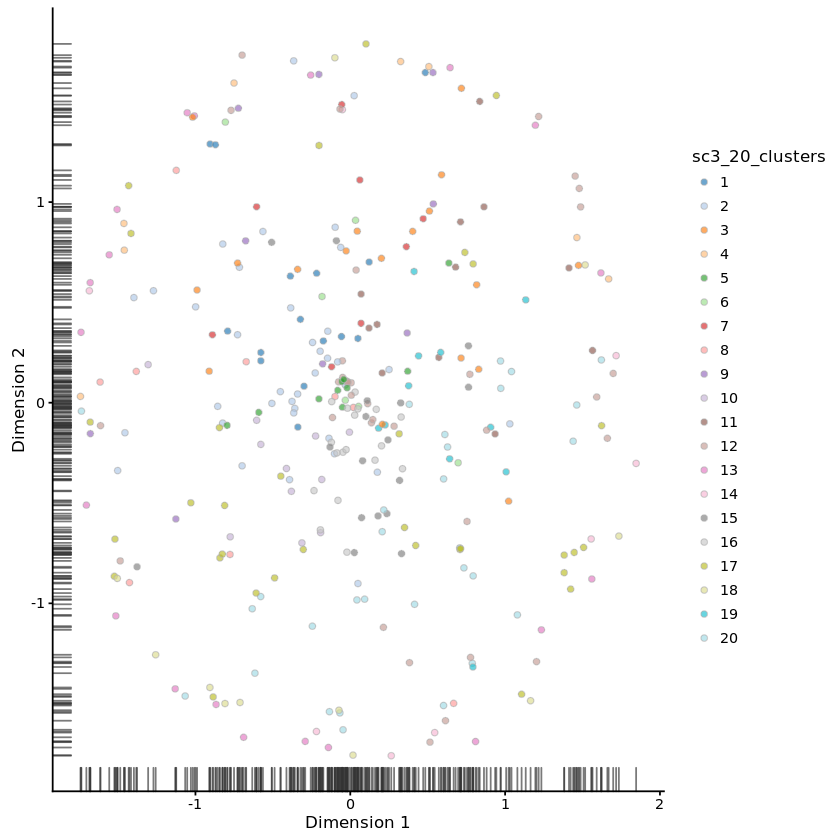

k = 6


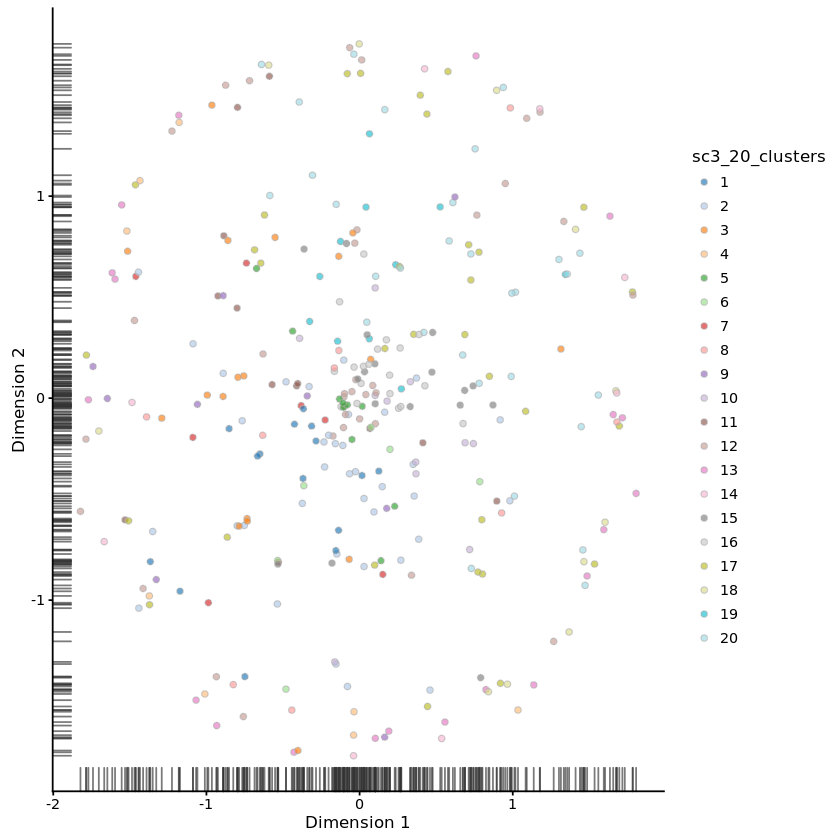

k = 8


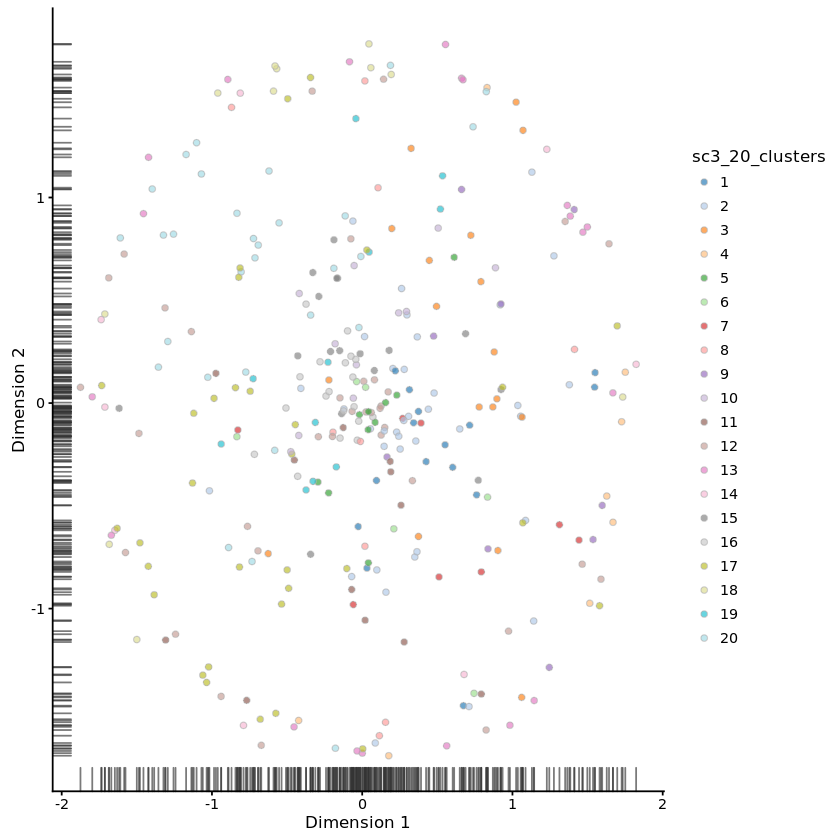

k = 9


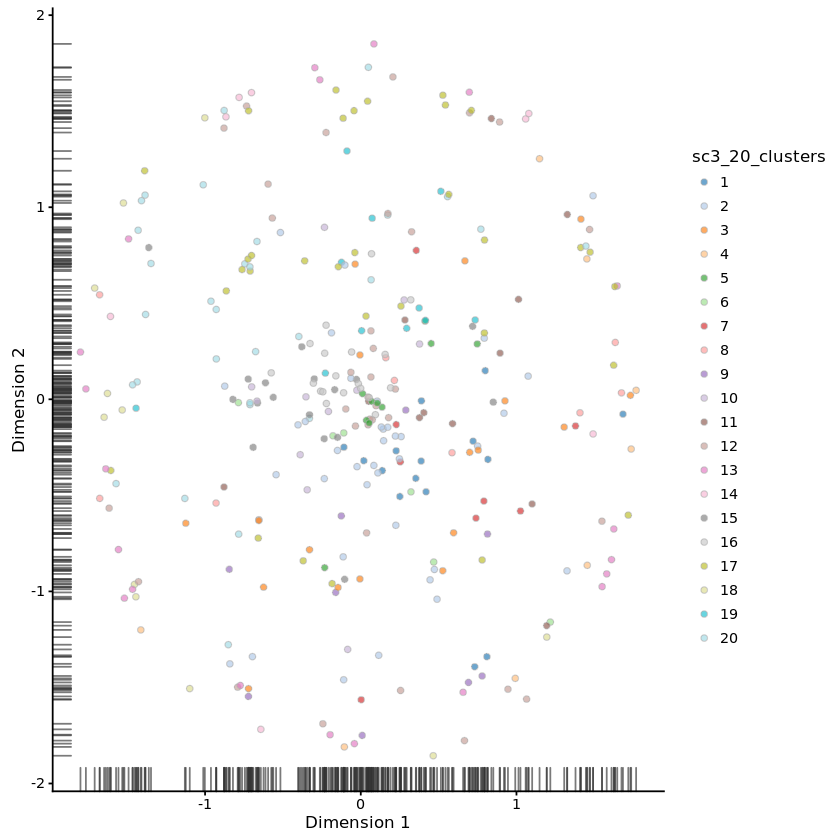

k = 10


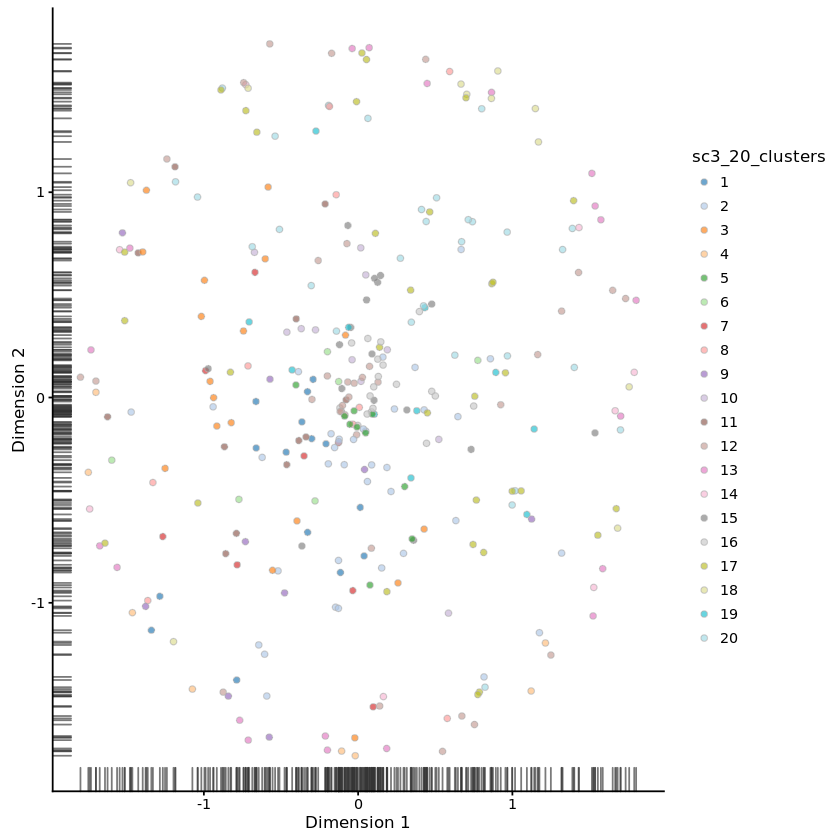

k = 15


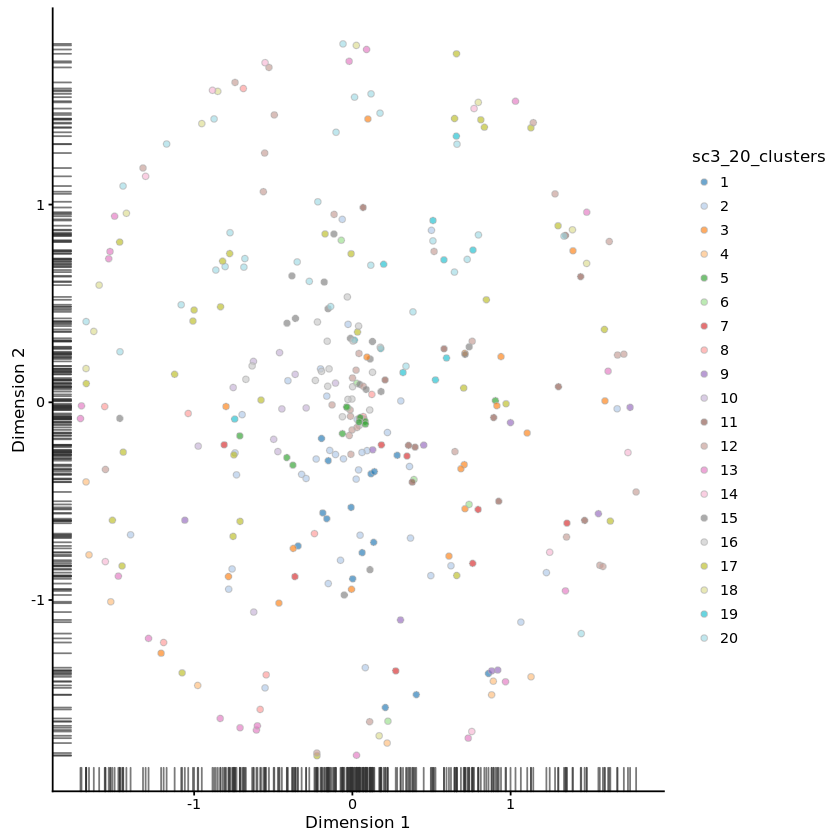

k = 20


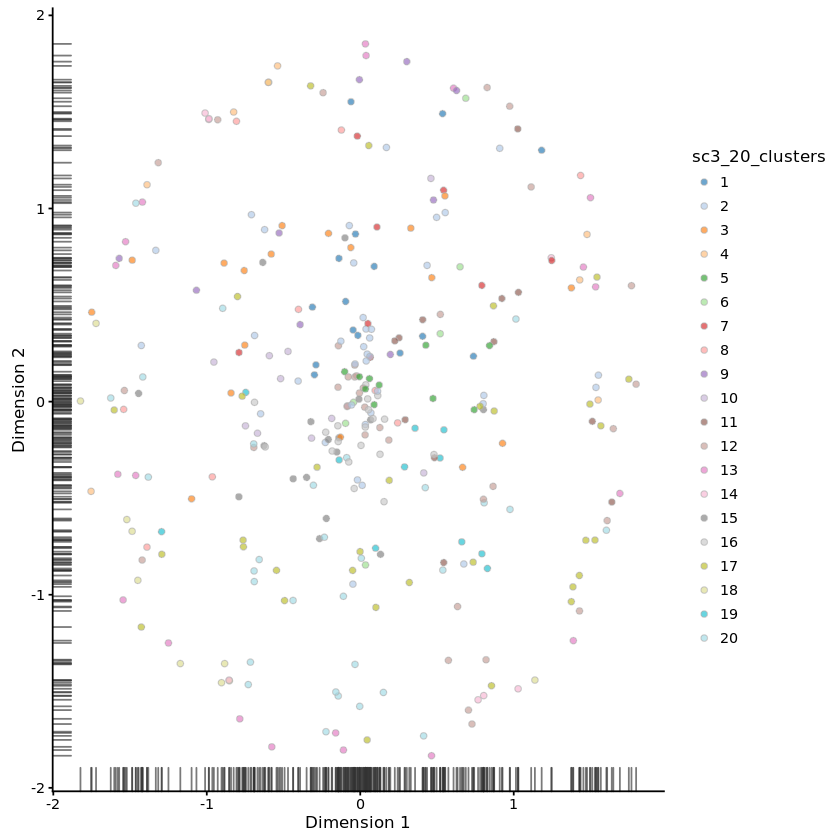

k = 25


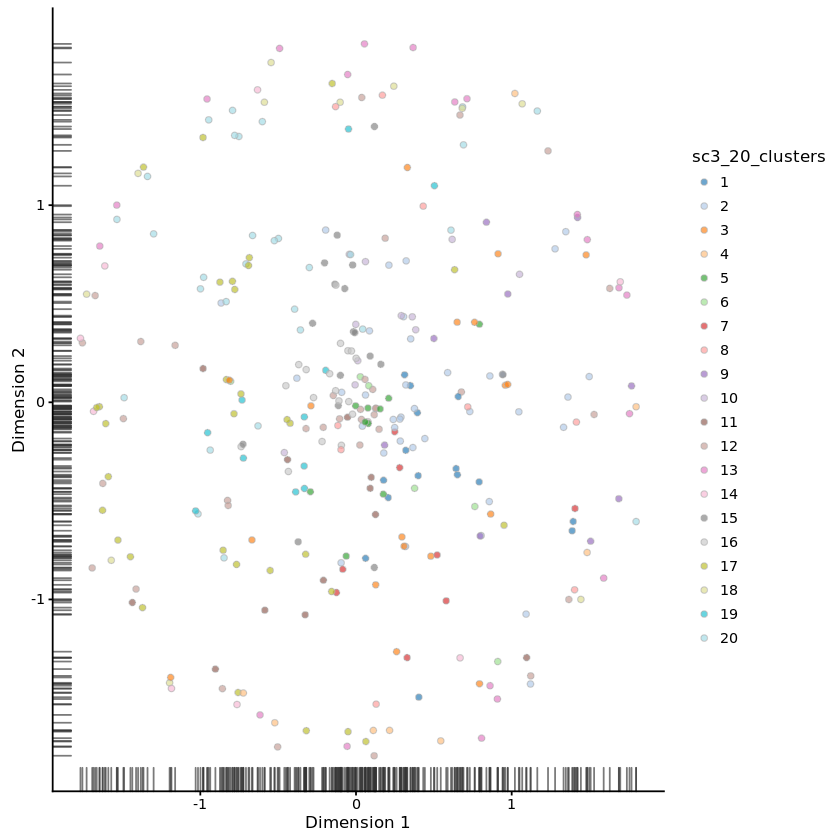

k = 30


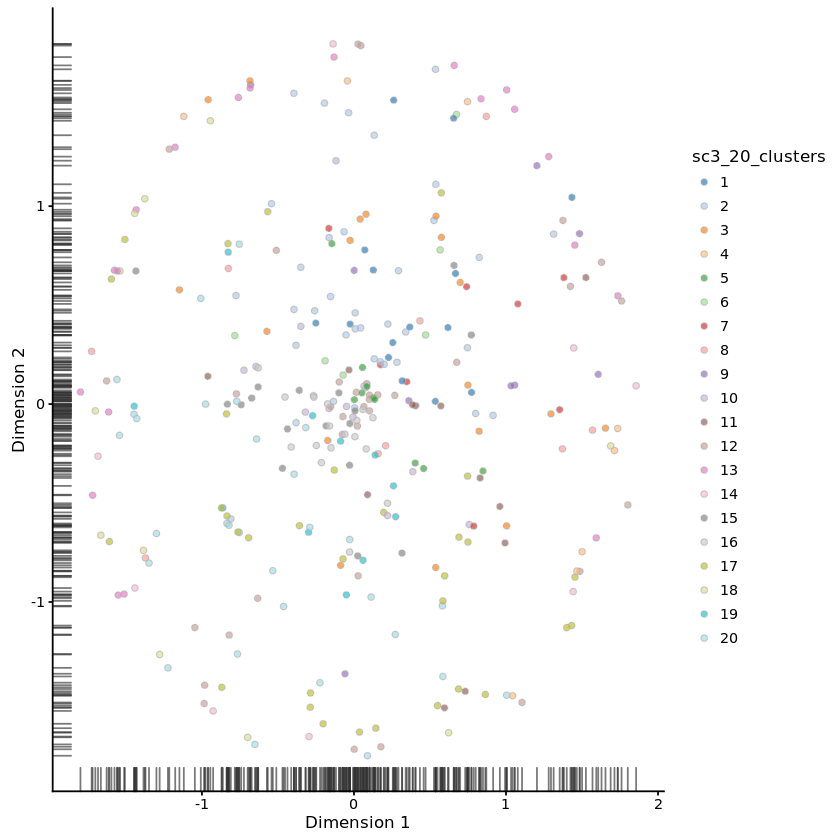

k = 37


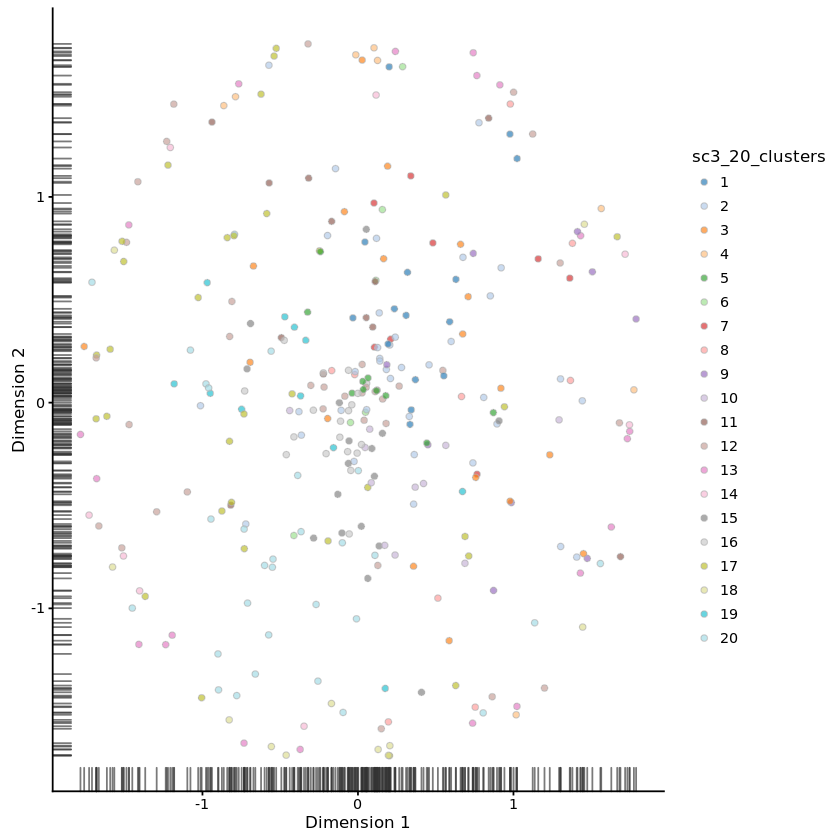

In [83]:
cat("Plots\n")
for (k in krange){   
    print(plotTSNE(
       sce_scran,
       #size_by = "total_features",
       colour_by = sprintf("sc3_%.0f_clusters", 20)
    ))
    cat(sprintf("k = %.0f\n", k))
}


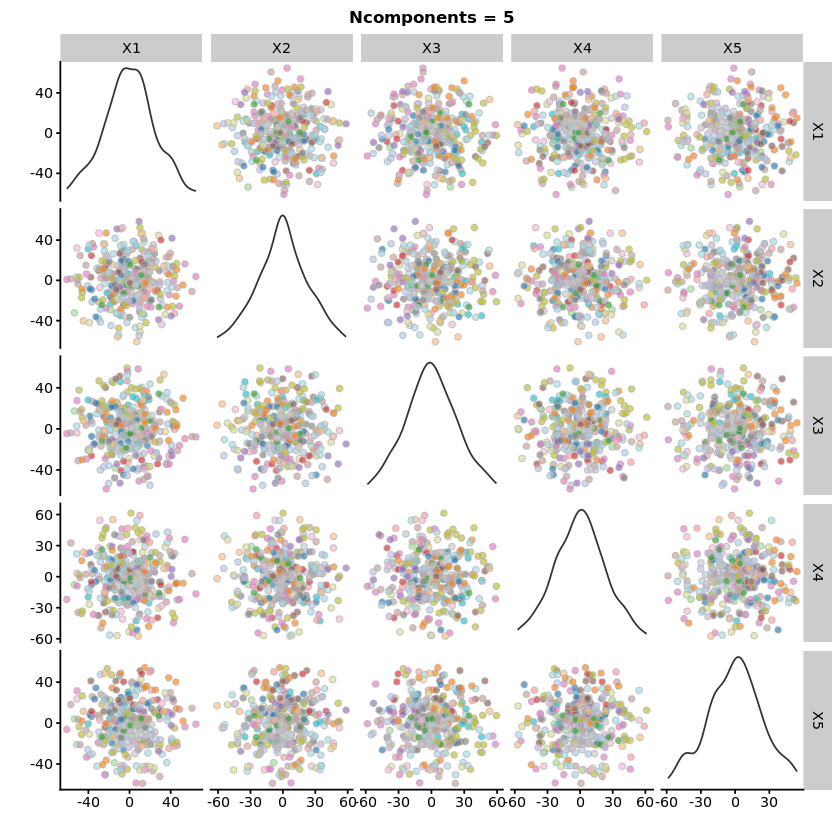

In [88]:
#The problem isn't so much SC3 as it is the fact that the clustering is shite.
# Let's try find some tsne settings that actually work

printInteresting <- function(ntoppers){
    multiplot(plotlist = (
        lapply(ntoppers, function(x){
                      
            return(plotTSNE(
                sce_scran, exprs_values = "logcounts", ncomponents=x,
                colour_by = sprintf("sc3_%.0f_clusters", 20),
            ) + guides(fill=F
            ) + ggtitle(sprintf("Ncomponents = %.0f", x)
            ) + ylab("") 
            )
        })
    ), layout = rbind(c(1,2),c(3,4) ) #,c(5,6),c(7,8))
    )
    cat(sprintf("\n\n\n\nk = %.0f\n", x))
}

#printInteresting(c(2,3,4,5))


plotTSNE(
    sce_scran, exprs_values = "logcounts", ncomponents=5,
    colour_by = sprintf("sc3_%.0f_clusters", 20),
) + guides(fill=F) + ggtitle(sprintf("Ncomponents = %.0f", 5)) + ylab("")


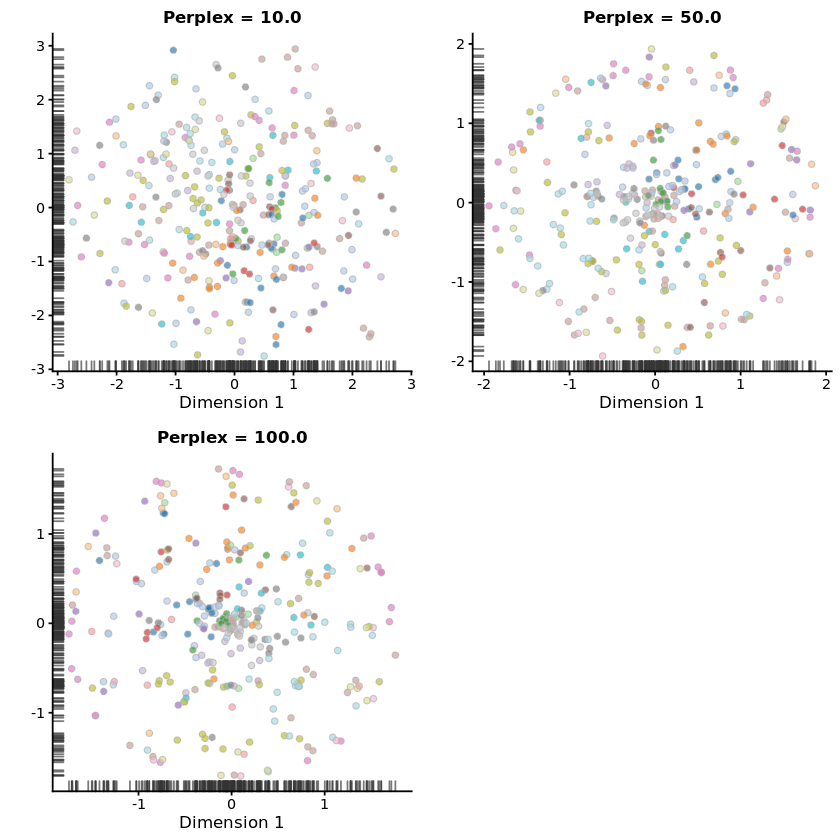

In [94]:
# Altering ncomponents had no effect. Let's try  changing the perplexity
printInteresting <- function(ntoppers){
    multiplot(plotlist = (
        lapply(ntoppers, function(x){
                      
            return(plotTSNE(
                sce_scran, exprs_values = "logcounts", perplexity=x,
                colour_by = sprintf("sc3_%.0f_clusters", 20),
            ) + guides(fill=F
            ) + ggtitle(sprintf("Perplex = %.1f", x)
            ) + ylab("") 
            )
        })
    ), layout = rbind(c(1,2),c(3,4) ) #,c(5,6),c(7,8))
    )
}

printInteresting(c(10,50,100))


Perplexity should be lower than K!
Perplexity should be lower than K!
Perplexity should be lower than K!


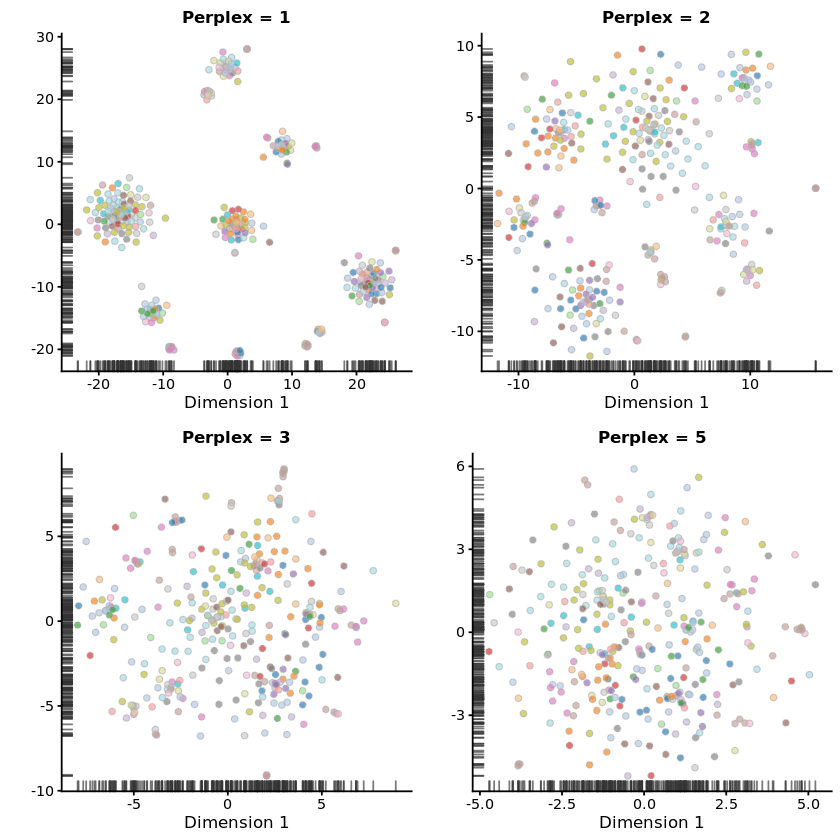

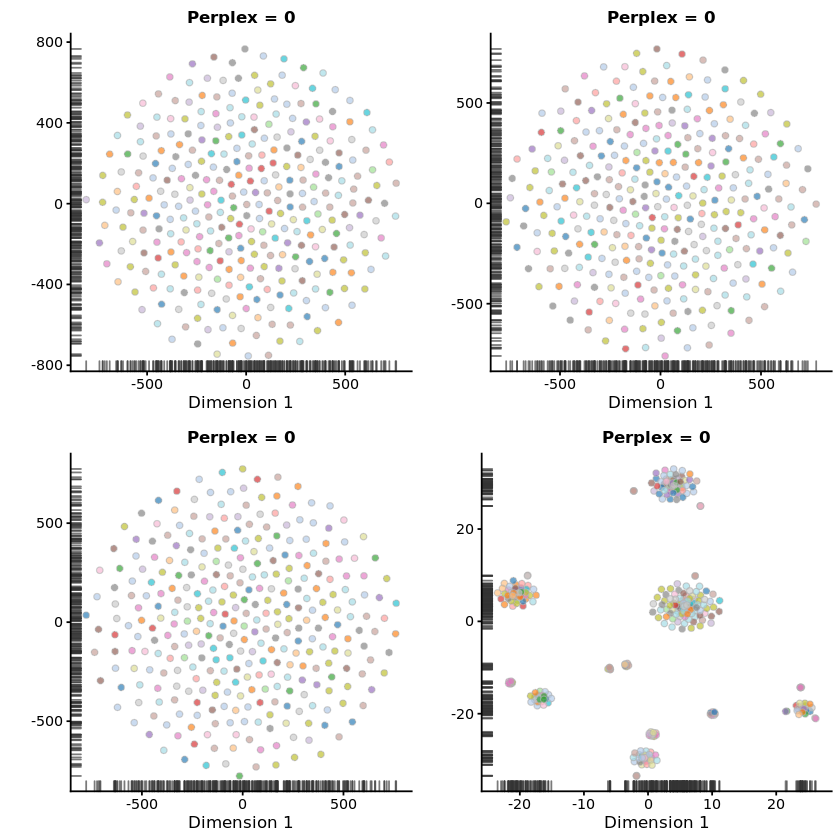

In [92]:
printInteresting(c(1,2,3,5))
printInteresting(c(0.1,0.2,0.3,0.5))

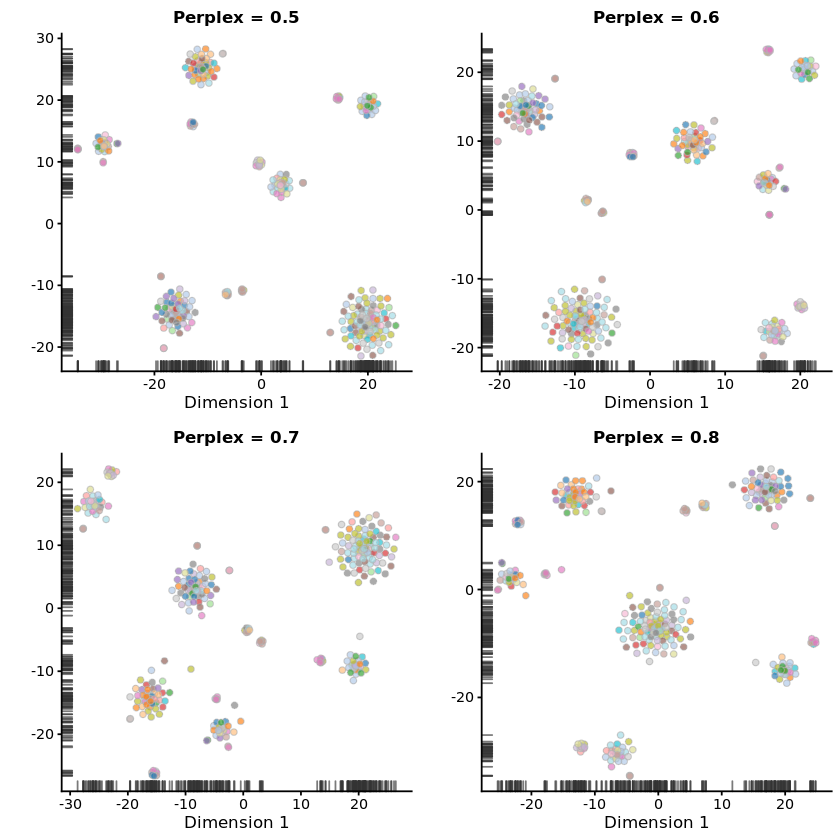

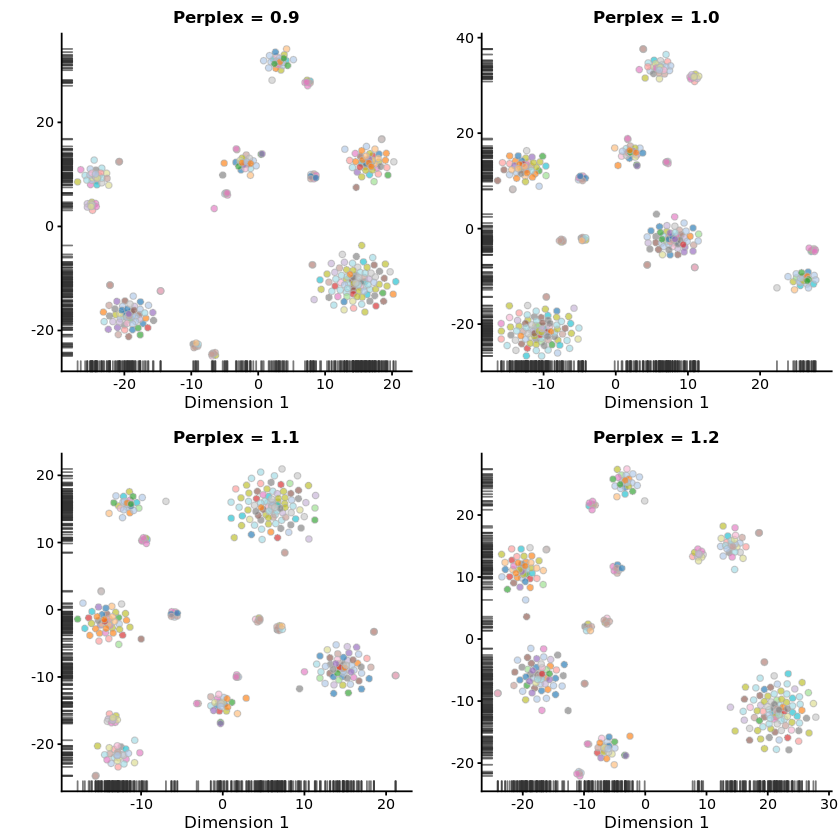

In [95]:
printInteresting(c(0.5,0.6,0.7,0.8))
printInteresting(c(0.9,1,1.1,1.2))

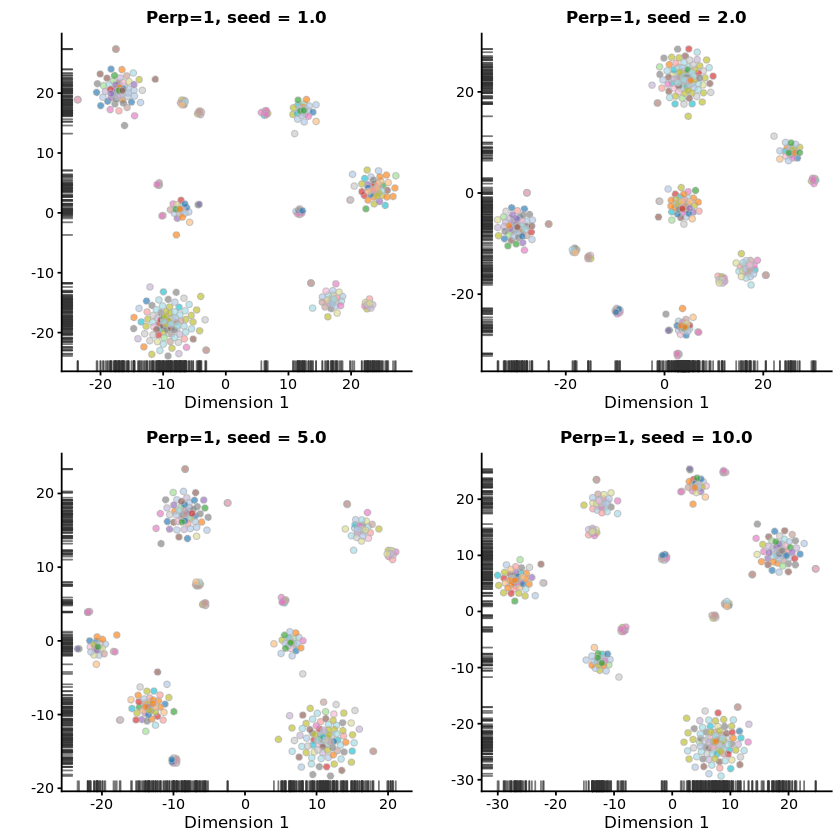

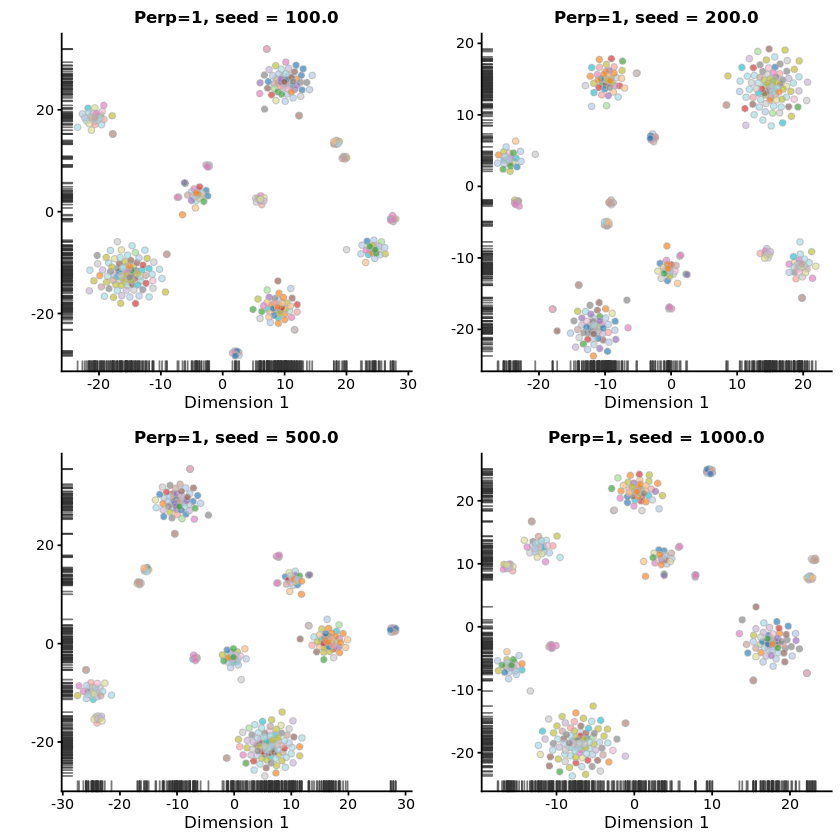

In [103]:
# Perplexity appears to be integer and clustering seems best when it is very very low == 1.
# Let us try changing the rannd_seed and seing what happens.
printInteresting <- function(ntoppers){
    multiplot(plotlist = (
        lapply(ntoppers, function(x){
                      
            return(plotTSNE(
                sce_scran, exprs_values = "logcounts", perplexity=1, rand_seed = x,
                colour_by = sprintf("sc3_%.0f_clusters", 20),
            ) + guides(fill=F
            ) + ggtitle(sprintf("Perp=1, seed = %.1f", x)
            ) + ylab("") 
            )
        })
    ), layout = rbind(c(1,2),c(3,4) ) #,c(5,6),c(7,8))
    )
}

printInteresting(c(1,2,5,10))
printInteresting(c(100,200,500,1000))

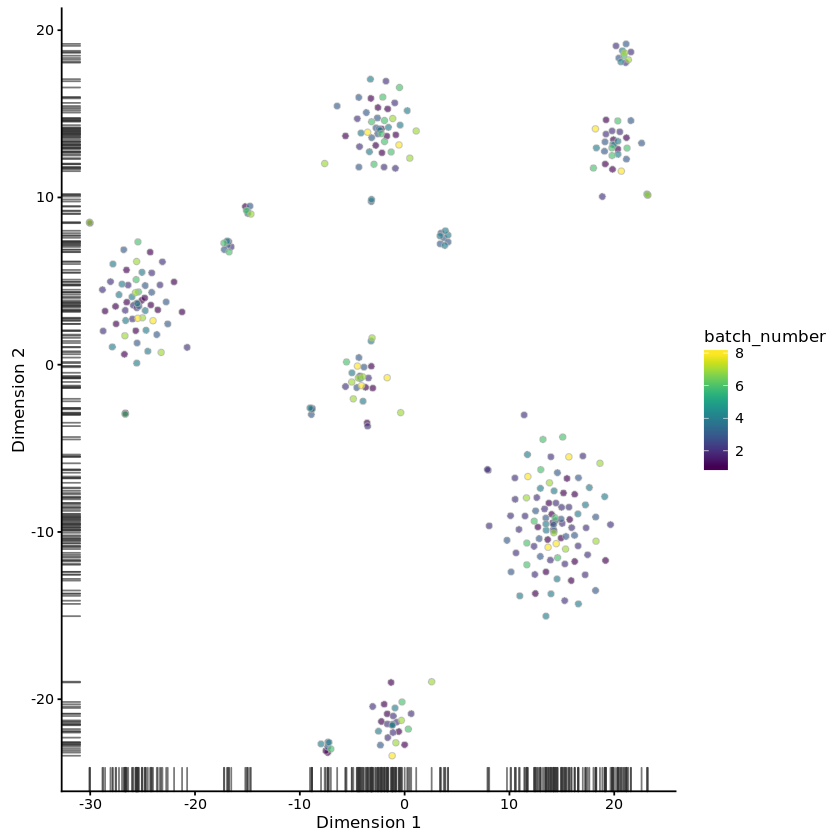

In [111]:
# The seed itself doesn't do much. Let's try some alternate colouring.
# First let's check to see if batch effects prevail.
plotTSNE(
    sce_scran, exprs_values = "logcounts", perplexity=1, rand_seed = 17,
    colour_by = "batch_number"
)

[1]  2  3  4  5  6  8  9 10 15 20 25 30 37

NULL


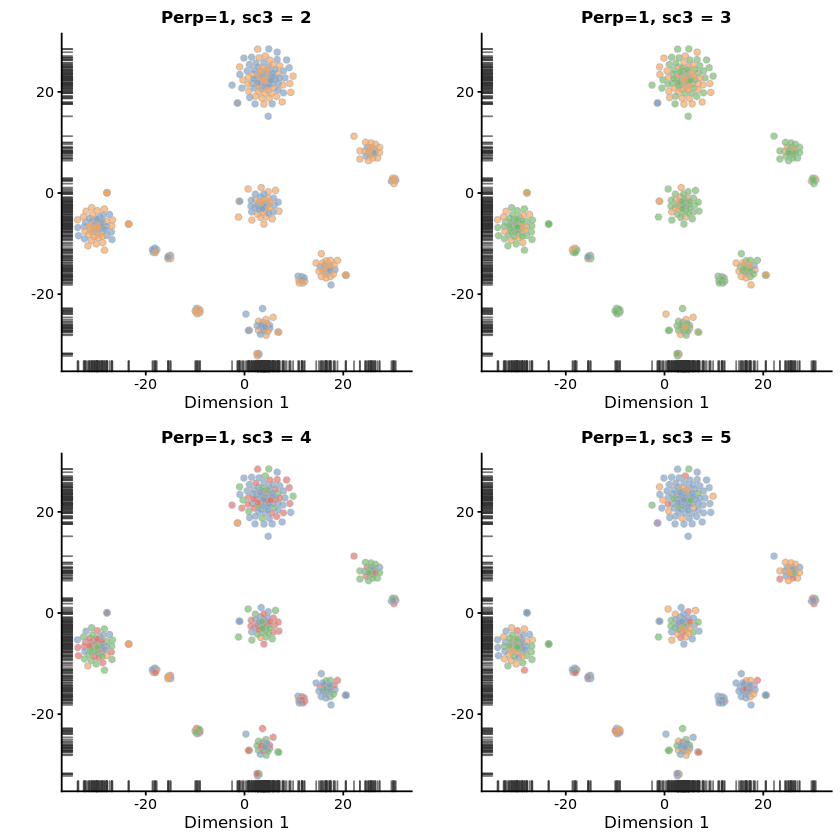

NULL
NULL


ERROR: Error in .choose_vis_values(object, colour_by, cell_control_default = TRUE, : 'sc3_NA_clusters' not found in 'colnames(colData(x))' or in 'rownames(x)'


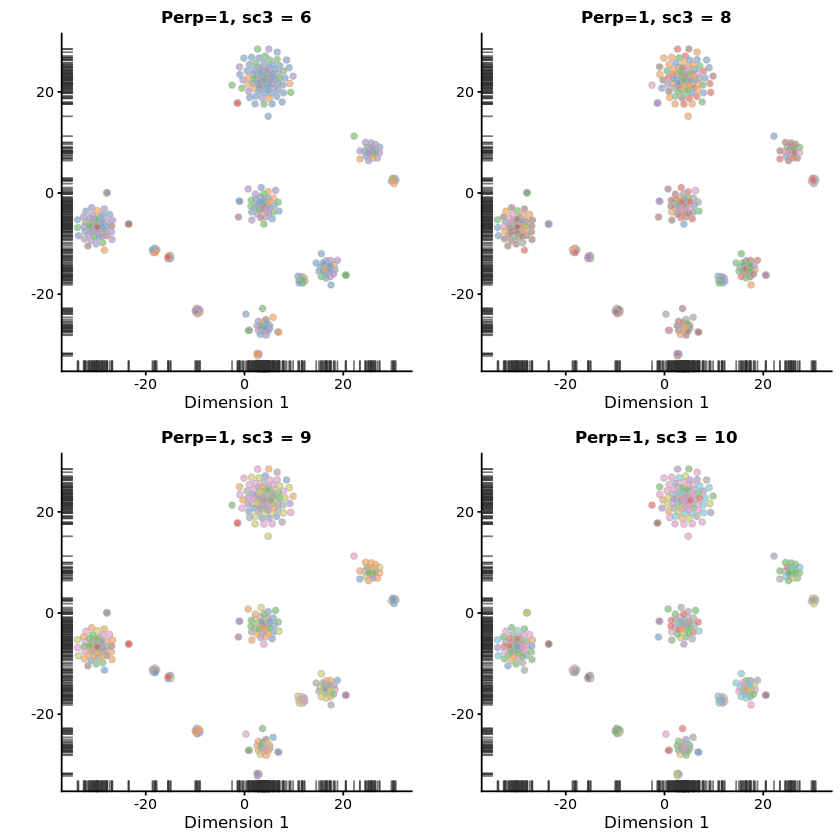

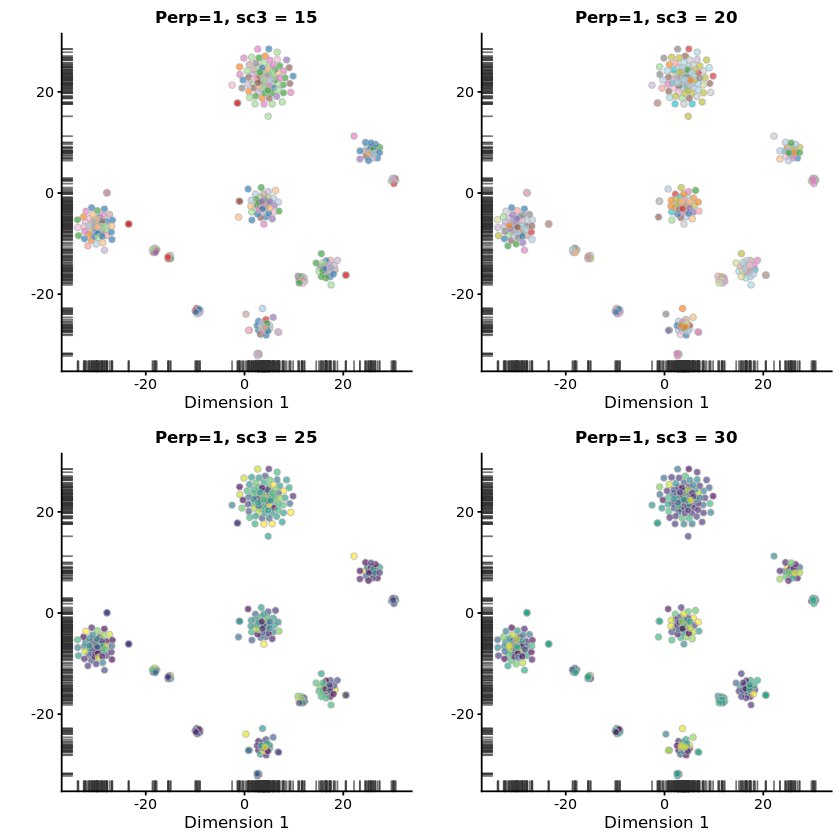

In [123]:
# Seems varied enough. Let's now try cycling through the different clusterings given by sc3
printInteresting <- function(ntoppers){
    multiplot(plotlist = (
        lapply(ntoppers, function(x){
                      
            return(plotTSNE(
                sce_scran, exprs_values = "logcounts", perplexity=1, rand_seed = 2,
                colour_by = sprintf("sc3_%.0f_clusters", x),
            ) + guides(fill=F
            ) + ggtitle(sprintf("Perp=1, sc3 = %.0f", x)
            ) + ylab("") 
            )
        })
    ), layout = rbind(c(1,2),c(3,4) ) #,c(5,6),c(7,8))
    )
}

k = 1
rr <- krange
rr
while (k <= length(rr)){
    sta = k
    k = k + 4
    end = k - 1
    print(
        printInteresting(rr[sta:end])
    )
}

In [124]:
# Shitty colouring all around... 
# Let's try PCA again.

sce_scran <- runPCA(sce_scran, ntop = 2000, ncomponents = 5)

[1]  2  3  4  5  6  8  9 10 15 20 25 30 37

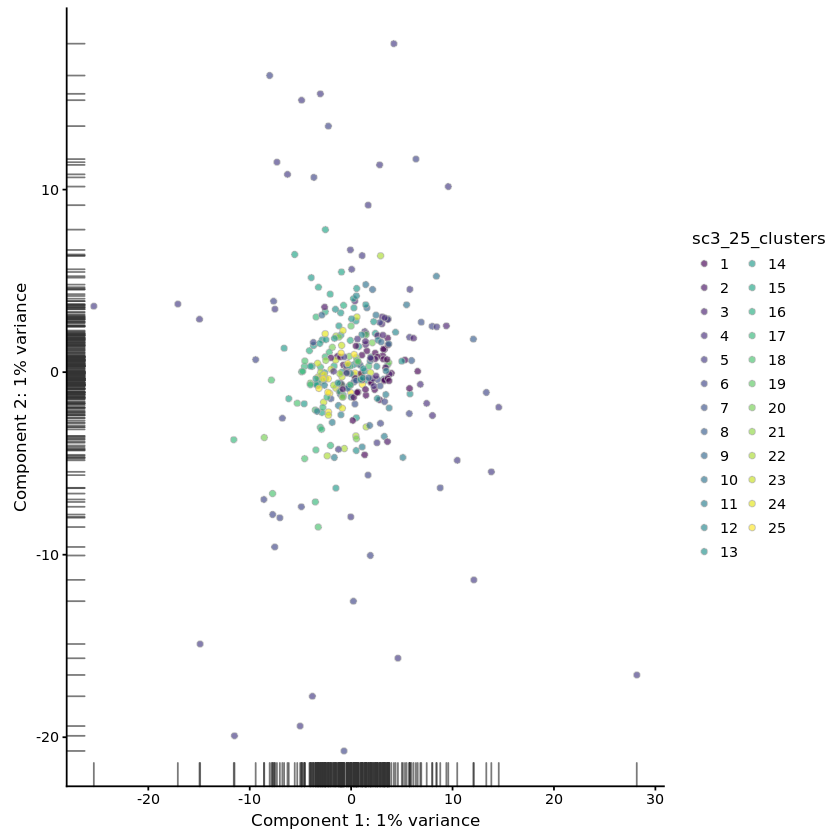

In [133]:
krange
plotPCA(sce_scran, colour_by = sprintf("sc3_%.0f_clusters", 25))